In [5]:
import polars as pl

# Read data from CSV file
filtered_df = pl.read_csv("../../data/cleansed_data.csv").select(
    ["order_seated_at_local", "order_uuid", "venue_xref_id", "business_date", "concept"]
)

print(filtered_df)
# Remove rows with None concept
filtered_df = filtered_df.filter(pl.col("concept").is_not_null())

# Convert to datetime
filtered_df = filtered_df.with_columns(
    pl.col("order_seated_at_local").str.strptime(pl.Datetime, "%Y-%m-%d %H:%M:%S")
)

# Create order_count column
filtered_df = filtered_df.with_columns(
    pl.lit(1).alias("order_count")
)

# Extract hour
filtered_df = filtered_df.with_columns(
    pl.col("order_seated_at_local").dt.hour().alias("hour")
)

# Group by venue, business date, and hour, then sum the order counts
hourly_order_counts = (
    filtered_df
    .group_by(["venue_xref_id", "business_date", "hour"])
    .agg(
        pl.sum("order_count").alias("order_count")
    )
)

# Calculate the average order count per hour for each venue
average_hourly_order_counts = (
    hourly_order_counts
    .join(
        filtered_df.select(["venue_xref_id", "concept"]).unique(),
        on="venue_xref_id"
    )
    .group_by(["venue_xref_id", "concept", "hour"])
    .agg(
        pl.mean("order_count").alias("order_count")
    )
    .sort(["venue_xref_id", "hour"])  # Ensure data is sorted by hour
)
# Normalize order counts for each venue
venue_max_orders = (
    average_hourly_order_counts
    .group_by("venue_xref_id")
    .agg(pl.max("order_count").alias("max_orders"))
)

average_hourly_order_counts = (
    average_hourly_order_counts
    .join(venue_max_orders, on="venue_xref_id")
    .with_columns(
        (pl.col("order_count") / pl.col("max_orders")).alias("normalized_order_count")
    )
    .drop("max_orders")
)

# Export to CSV
average_hourly_order_counts.write_csv("../../data/final_data.csv")



shape: (8_954_786, 5)
┌──────────────────────┬─────────────────────┬─────────────────────┬───────────────┬───────────────┐
│ order_seated_at_loca ┆ order_uuid          ┆ venue_xref_id       ┆ business_date ┆ concept       │
│ l                    ┆ ---                 ┆ ---                 ┆ ---           ┆ ---           │
│ ---                  ┆ str                 ┆ str                 ┆ str           ┆ str           │
│ str                  ┆                     ┆                     ┆               ┆               │
╞══════════════════════╪═════════════════════╪═════════════════════╪═══════════════╪═══════════════╡
│ 2024-07-06 15:26:25  ┆ 240706152625~3E344F ┆ af2e308510a24a6aed6 ┆ 2024-07-06    ┆ FAMILY_DINING │
│                      ┆ 1F-746E-48D…        ┆ 59bd55bac3b…        ┆               ┆               │
│ 2024-07-10 19:20:42  ┆ 240710192042~5641CE ┆ af2e308510a24a6aed6 ┆ 2024-07-10    ┆ FAMILY_DINING │
│                      ┆ C2-0E43-4C8…        ┆ 59bd55bac3b…        ┆ 

## Time-Series Frequency Analysis

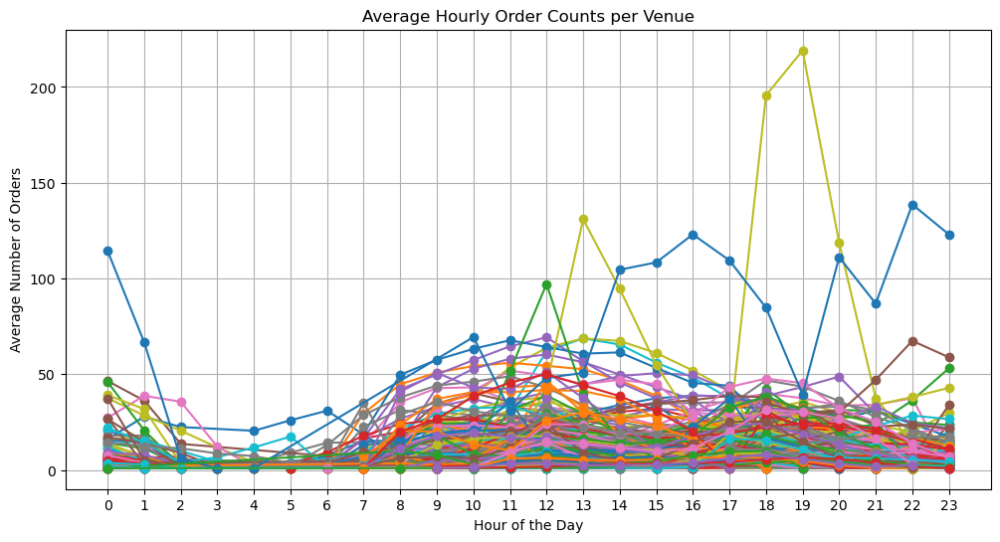

In [3]:
import polars as pl
import matplotlib.pyplot as plt

# Read data from CSV file
filtered_df = pl.read_csv("../../data/cleansed_data.csv").select(
    ["order_seated_at_local", "order_uuid", "venue_xref_id", "business_date", "concept"]
)

# Remove rows with None concept
filtered_df = filtered_df.filter(pl.col("concept").is_not_null())

# Convert to datetime
filtered_df = filtered_df.with_columns(
    pl.col("order_seated_at_local").str.strptime(pl.Datetime, "%Y-%m-%d %H:%M:%S")
)

# Create order_count column
filtered_df = filtered_df.with_columns(
    pl.lit(1).alias("order_count")
)

# Extract hour
filtered_df = filtered_df.with_columns(
    pl.col("order_seated_at_local").dt.hour().alias("hour")
)

# Group by venue, business date, and hour, then sum the order counts
hourly_order_counts = (
    filtered_df
    .group_by(["venue_xref_id", "business_date", "hour"])
    .agg(
        pl.sum("order_count").alias("order_count")
    )
)

# Calculate the average order count per hour for each venue
average_hourly_order_counts = (
    hourly_order_counts
    .join(
        filtered_df.select(["venue_xref_id", "concept"]).unique(),
        on="venue_xref_id"
    )
    .group_by(["venue_xref_id", "concept", "hour"])
    .agg(
        pl.mean("order_count").alias("order_count")
    )
    .sort(["venue_xref_id", "hour"])  # Ensure data is sorted by hour
)

# Plot the average hourly order counts for each venue
plt.figure(figsize=(12, 6))

for venue in average_hourly_order_counts.select("venue_xref_id").unique()["venue_xref_id"]:
    venue_data = average_hourly_order_counts.filter(pl.col("venue_xref_id") == venue)
    
    # Convert to lists for plotting
    hours = venue_data["hour"].to_list()
    counts = venue_data["order_count"].to_list()
    
    plt.plot(hours, counts, marker='o', label=str(venue))

plt.title('Average Hourly Order Counts per Venue')
plt.xlabel('Hour of the Day')
plt.ylabel('Average Number of Orders')
plt.grid(True)
plt.xticks(range(0, 24))
plt.show()

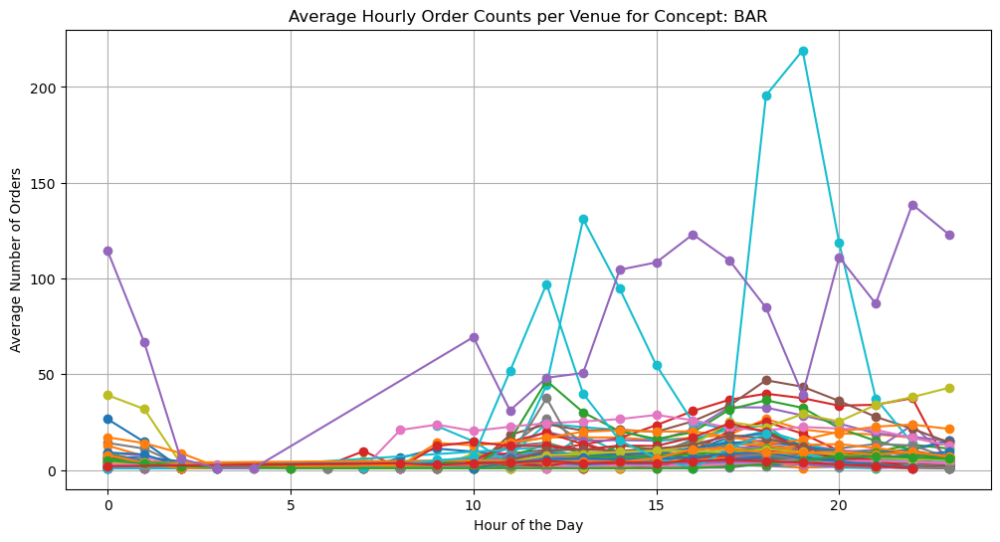

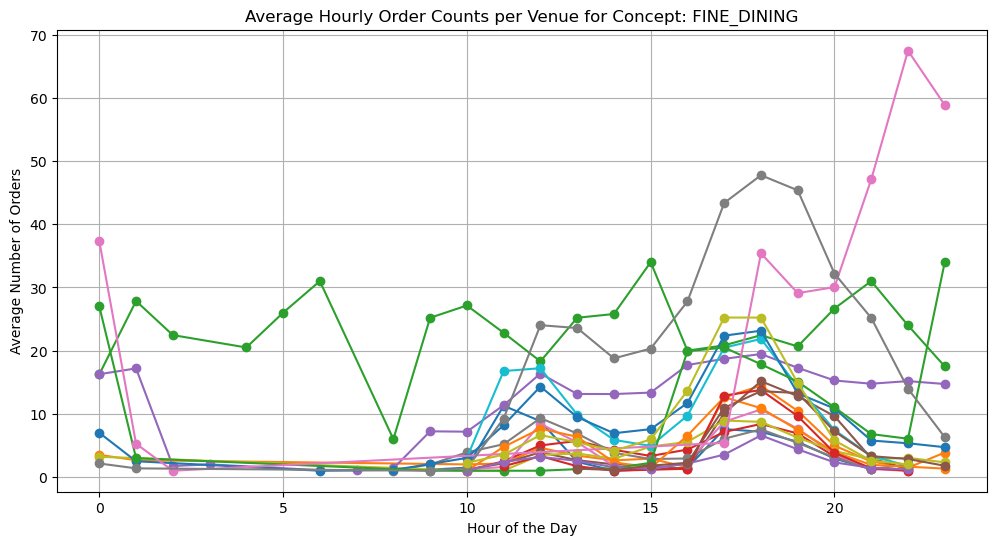

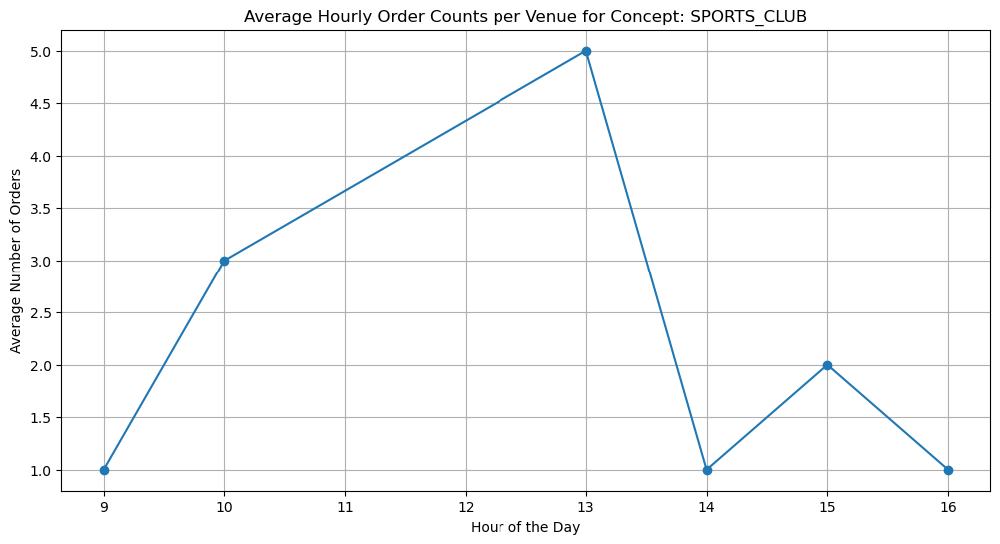

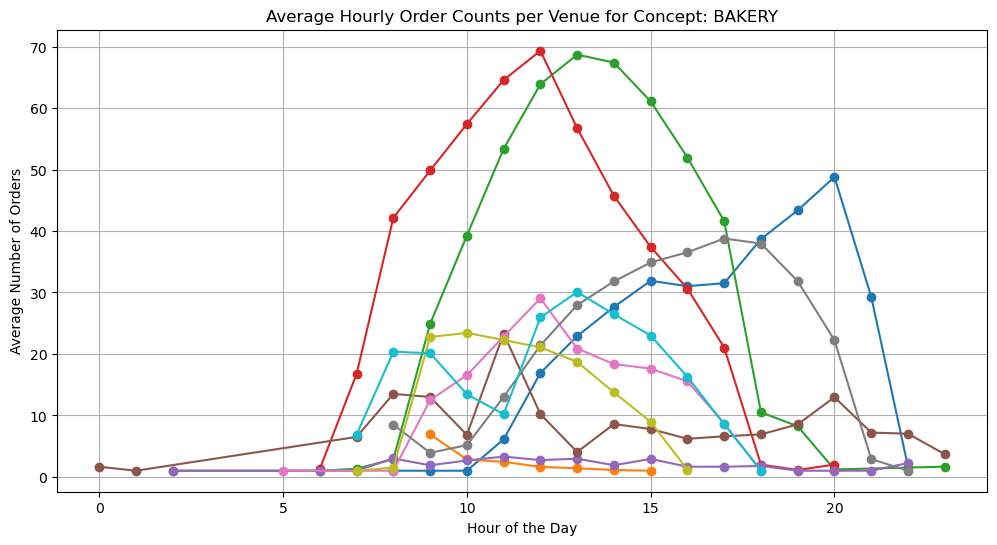

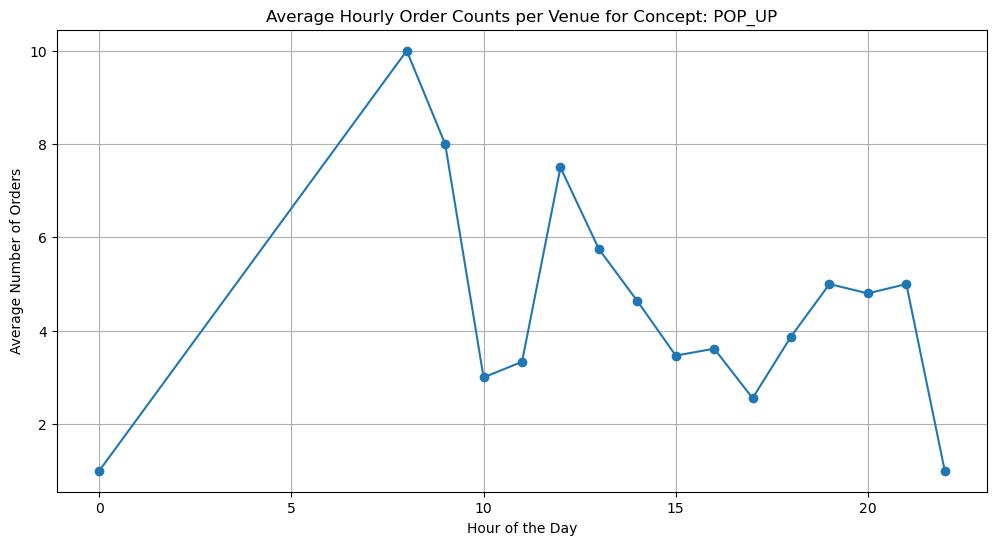

...

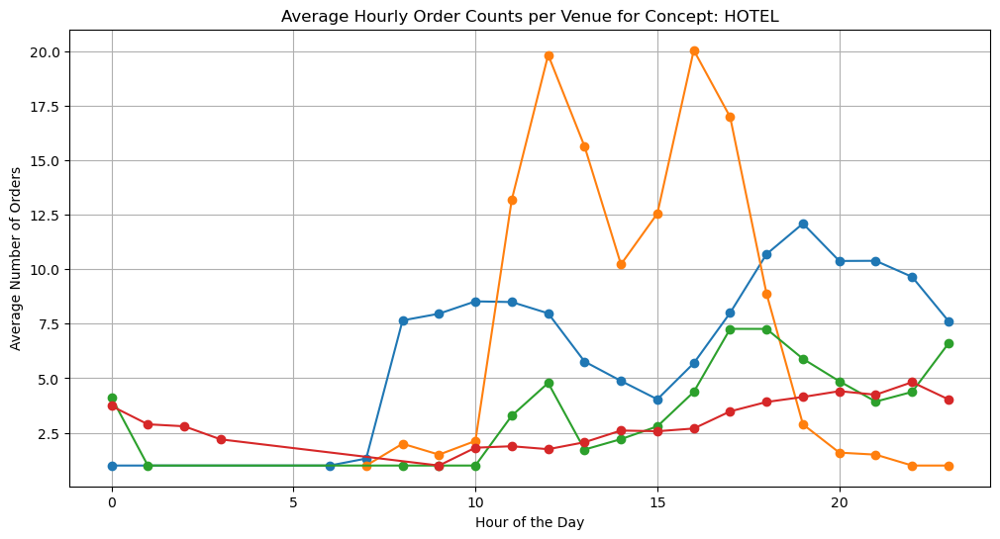

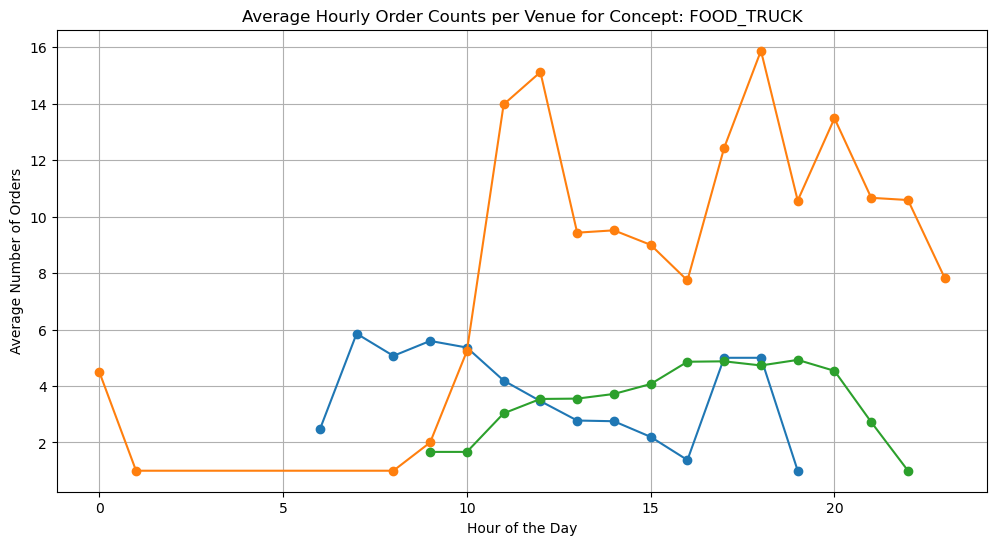

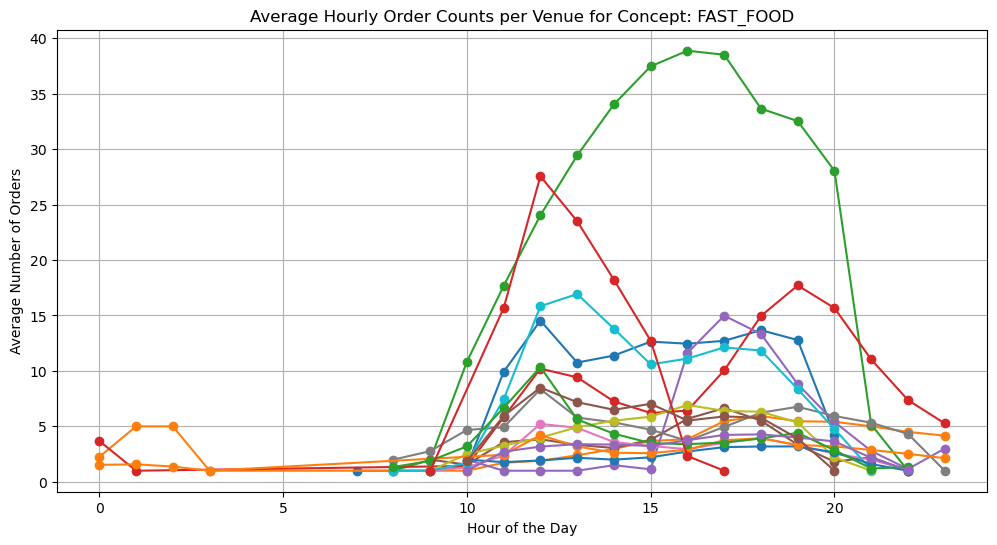

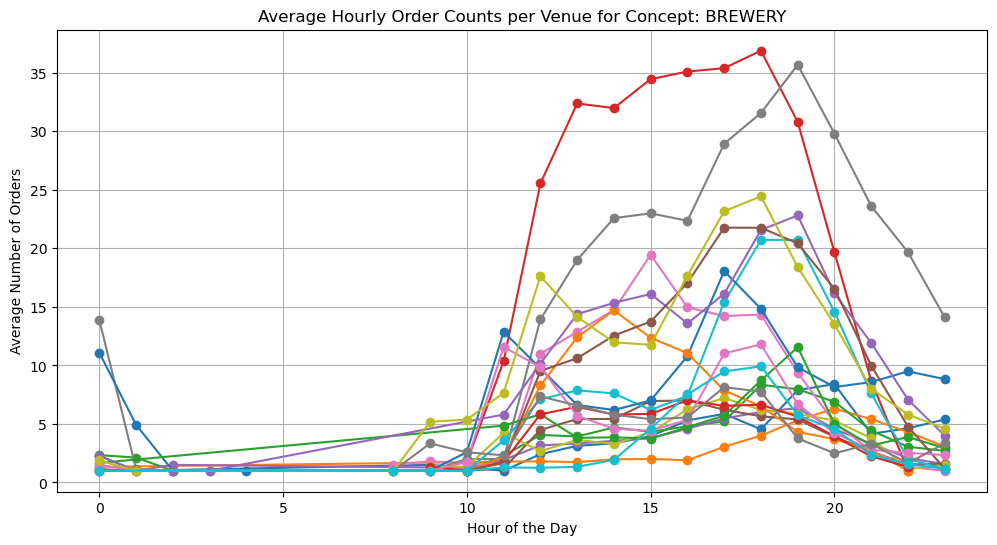

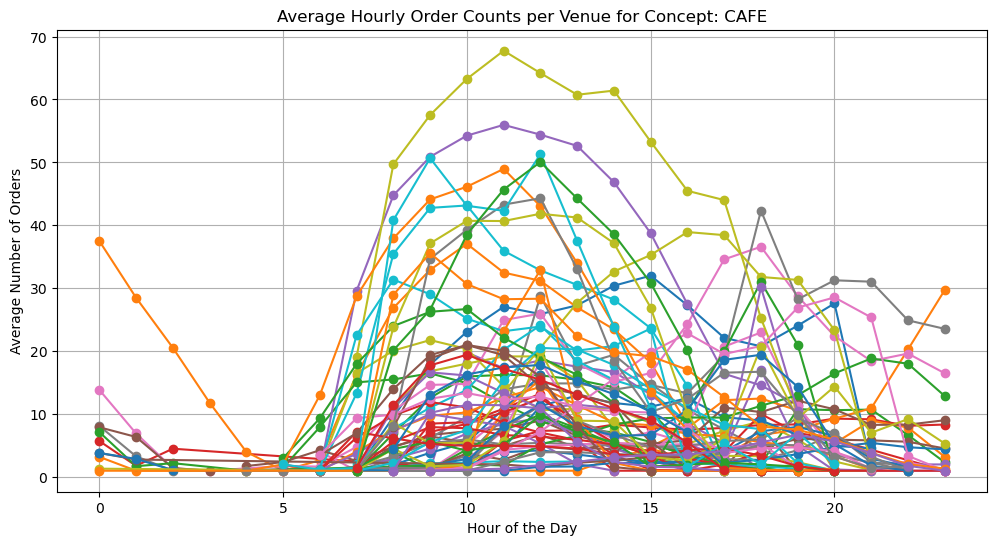

In [7]:
# Group by concept, venue, and hour, then calculate the average order count
concepts = average_hourly_order_counts.select("concept").unique()["concept"]

for concept in concepts:
    plt.figure(figsize=(12, 6))
    concept_data = average_hourly_order_counts.filter(pl.col("concept") == concept)
    
    for venue in concept_data.select("venue_xref_id").unique()["venue_xref_id"]:
        venue_data = concept_data.filter(pl.col("venue_xref_id") == venue)
        
        # Convert to lists for plotting
        hours = venue_data["hour"].to_list()
        counts = venue_data["order_count"].to_list()
        
        plt.plot(hours, counts, marker='o', label=str(venue))
    
    plt.title(f'Average Hourly Order Counts per Venue for Concept: {concept}')
    plt.xlabel('Hour of the Day')
    plt.ylabel('Average Number of Orders')
    plt.grid(True)
    plt.show()


## Normalization

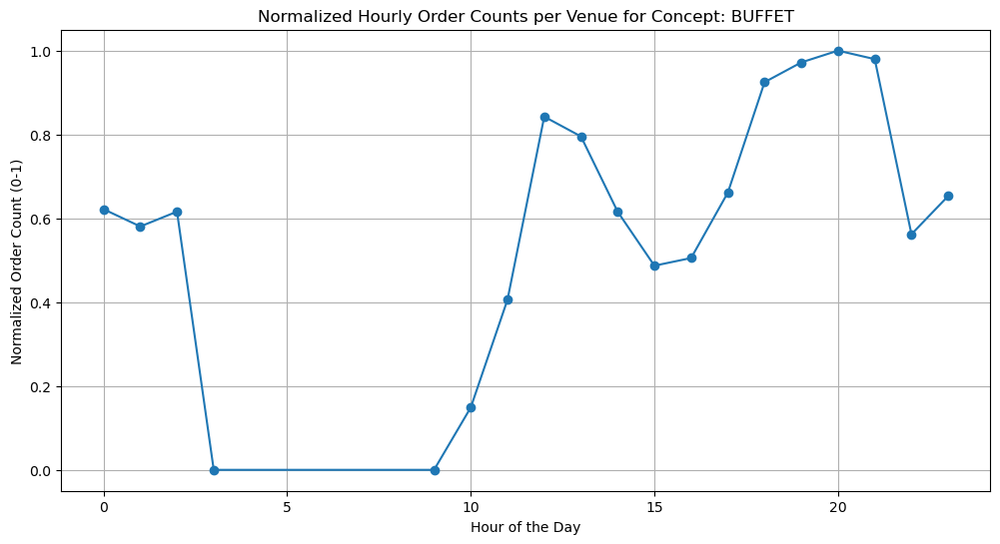

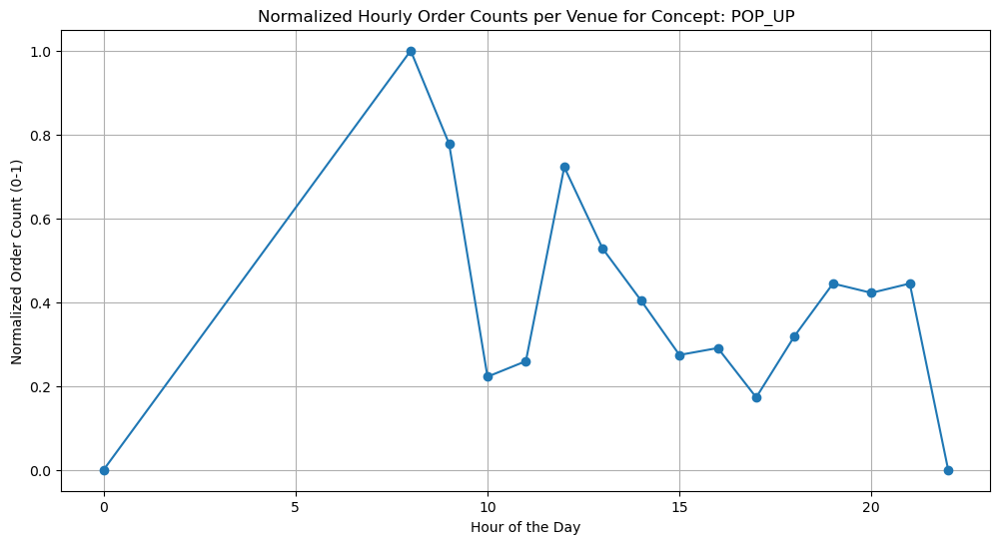

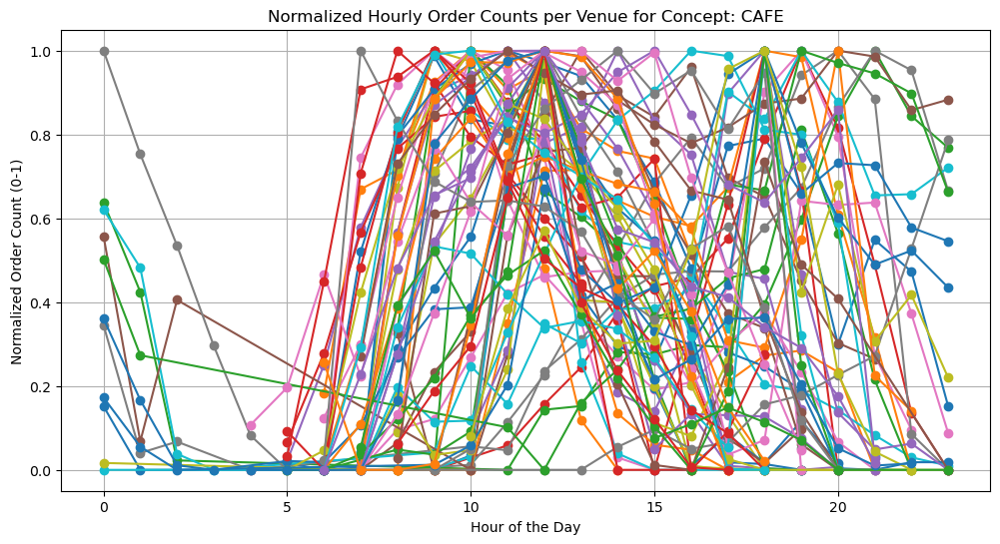

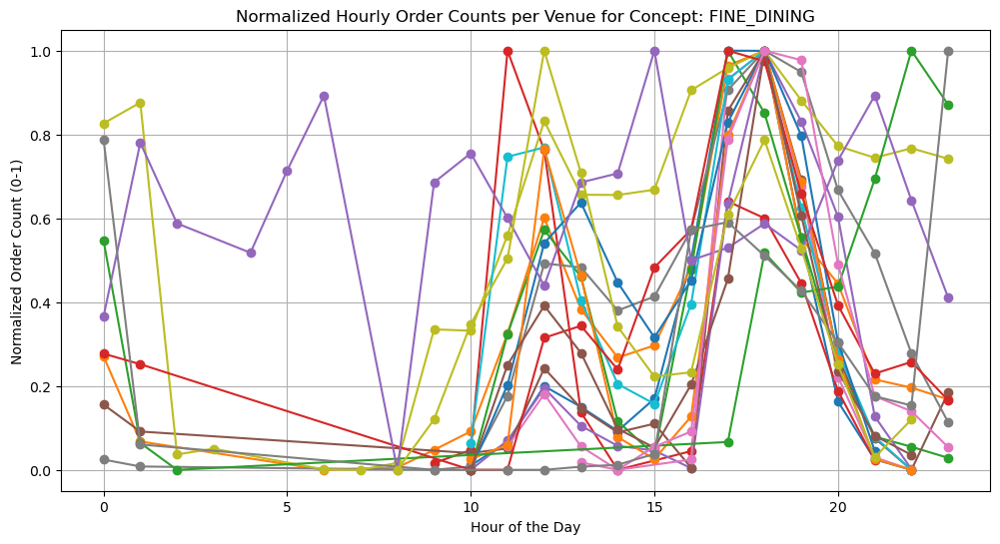

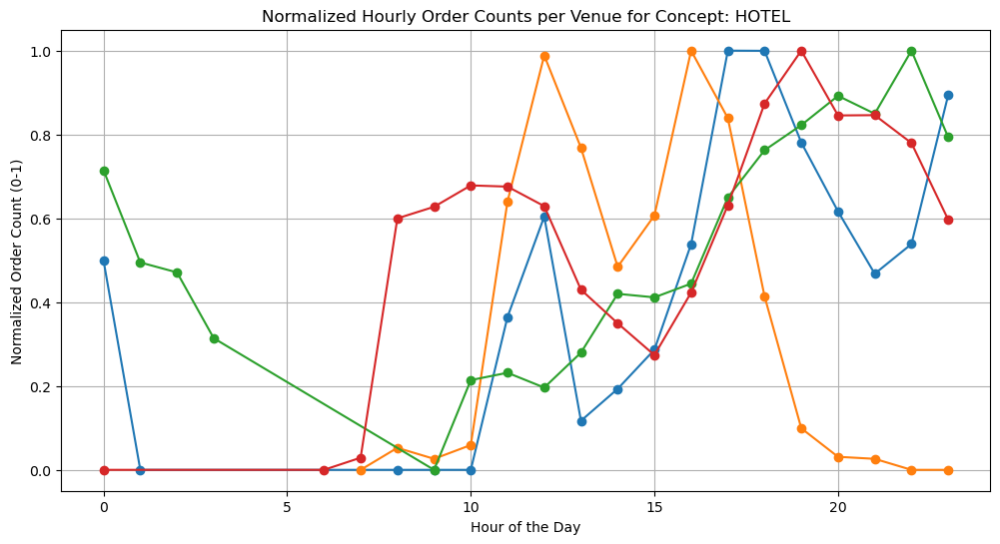

...

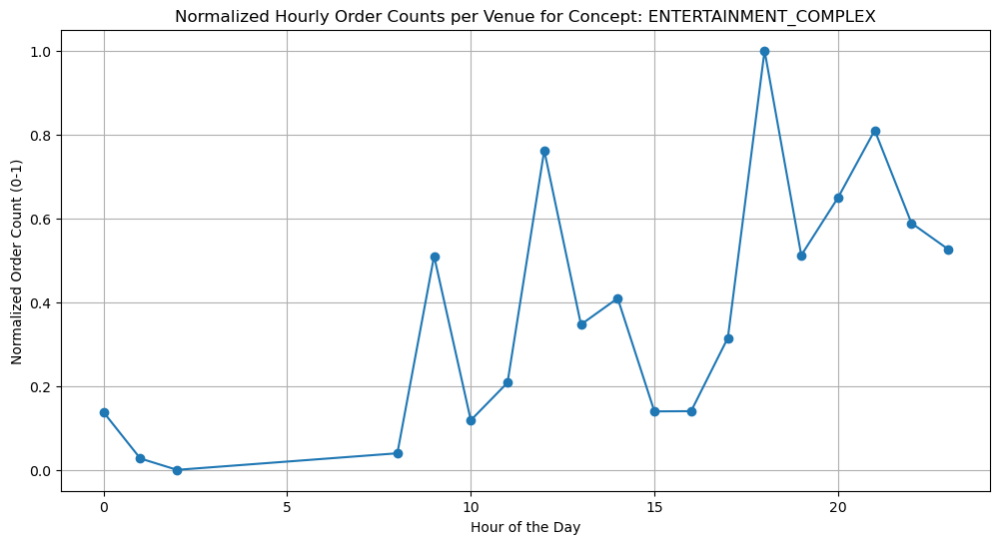

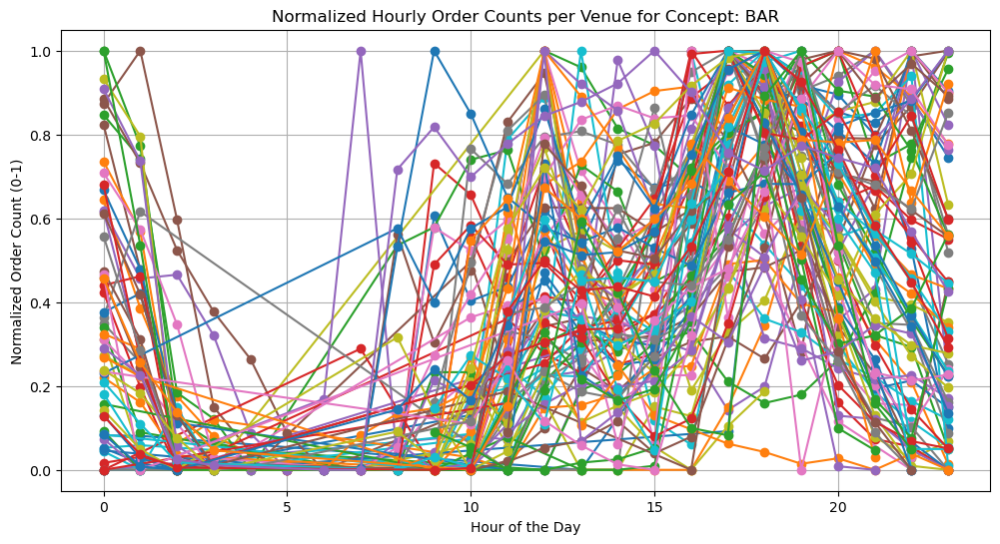

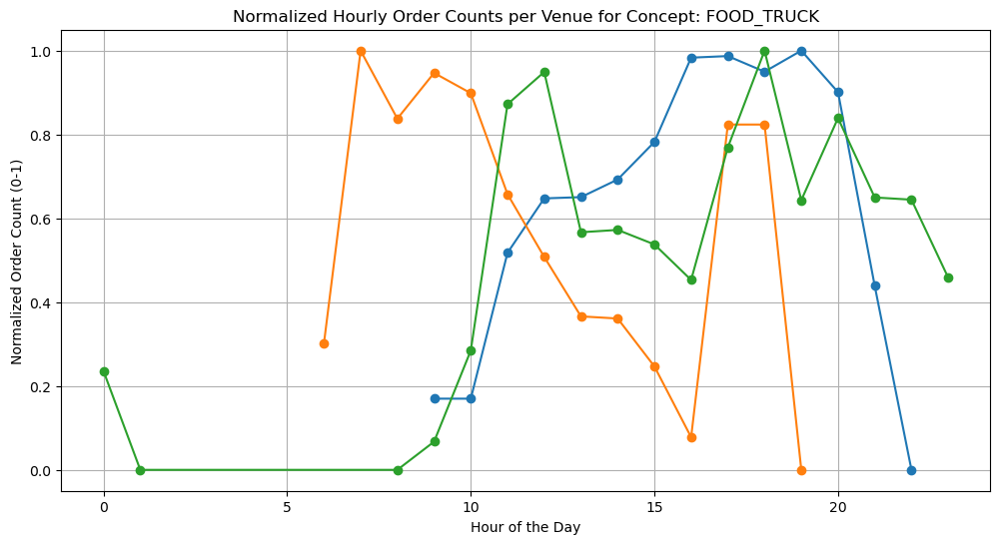

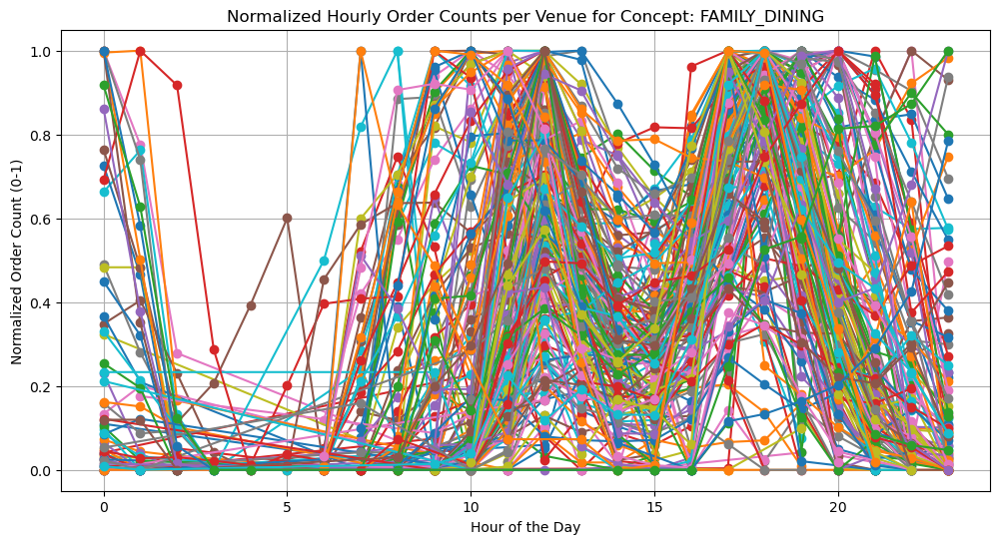

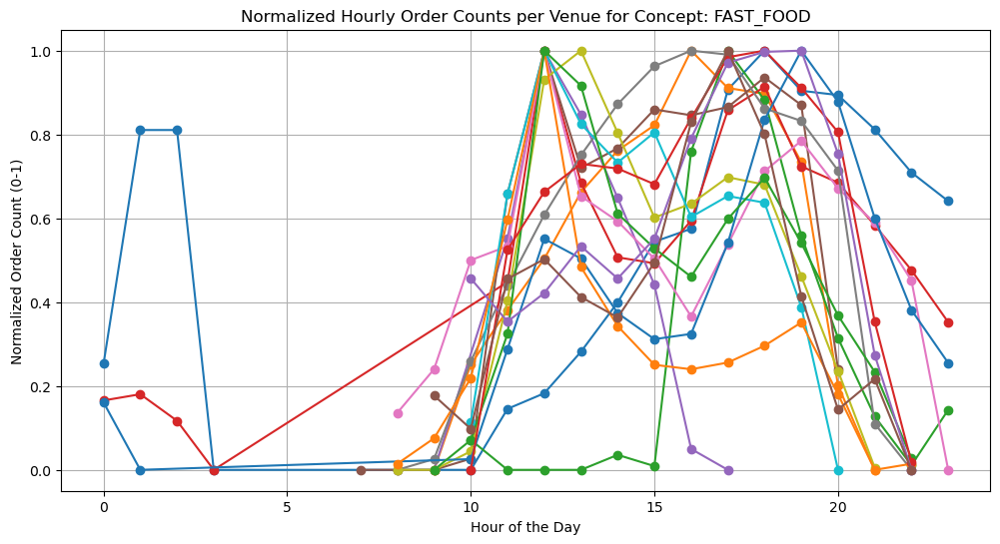

In [8]:
# Normalize order counts per venue (not per concept)
average_hourly_order_counts = average_hourly_order_counts.with_columns(
    (
        (pl.col('order_count') - pl.col('order_count').min().over(['concept', 'venue_xref_id'])) /
        (pl.col('order_count').max().over(['concept', 'venue_xref_id']) - pl.col('order_count').min().over(['concept', 'venue_xref_id']))
    ).alias('normalized_order_count')
)

# Plot the normalized hourly order counts
concepts = average_hourly_order_counts.get_column('concept').unique().to_list()
for concept in concepts:
    plt.figure(figsize=(12, 6))
    concept_data = average_hourly_order_counts.filter(pl.col('concept') == concept)
    
    for venue in concept_data.get_column('venue_xref_id').unique():
        venue_data = concept_data.filter(pl.col('venue_xref_id') == venue)
        plt.plot(venue_data.get_column('hour'), venue_data.get_column('normalized_order_count'), marker='o')

    plt.title(f'Normalized Hourly Order Counts per Venue for Concept: {concept}')
    plt.xlabel('Hour of the Day')
    plt.ylabel('Normalized Order Count (0-1)')
    plt.grid(True)
    plt.show()


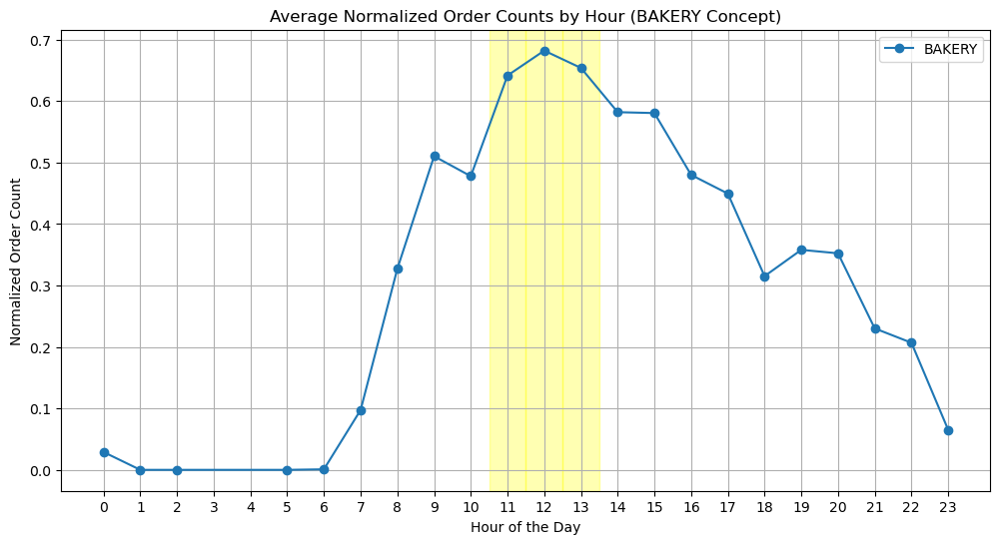

Peak hours for BAKERY concept:
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 12   ┆ 0.682075               │
│ 13   ┆ 0.653923               │
│ 11   ┆ 0.641594               │
└──────┴────────────────────────┘




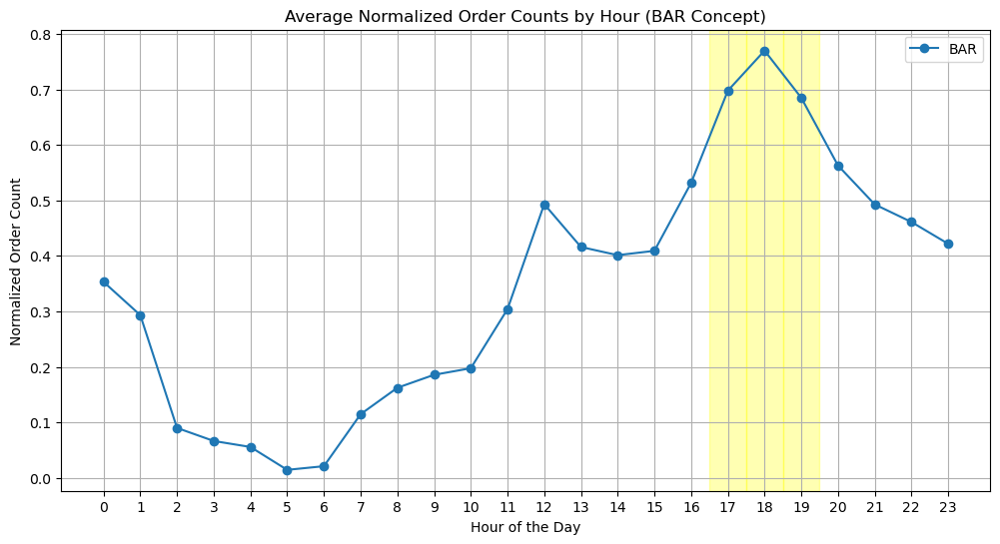

Peak hours for BAR concept:
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 18   ┆ 0.769765               │
│ 17   ┆ 0.697619               │
│ 19   ┆ 0.684777               │
└──────┴────────────────────────┘




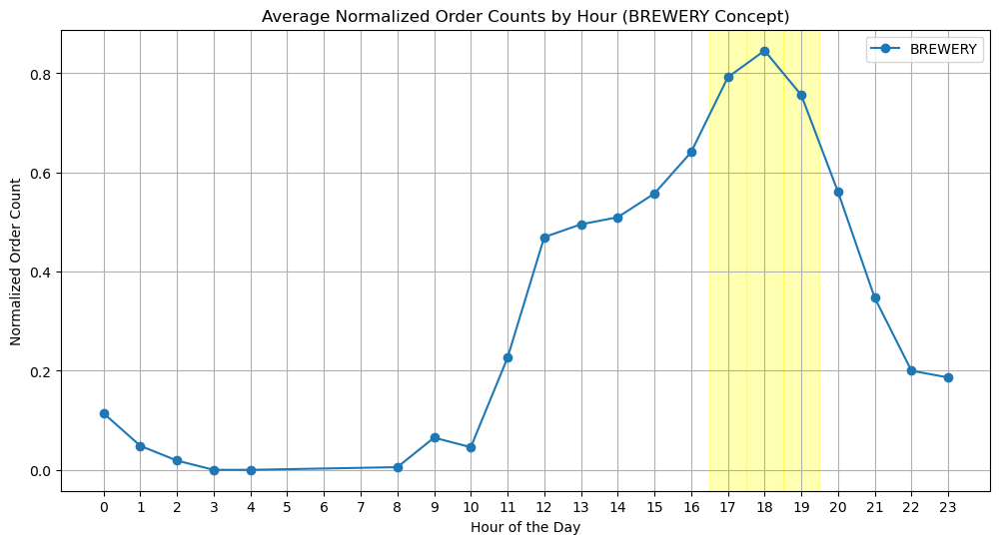

Peak hours for BREWERY concept:
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 18   ┆ 0.845708               │
│ 17   ┆ 0.791958               │
│ 19   ┆ 0.756124               │
└──────┴────────────────────────┘




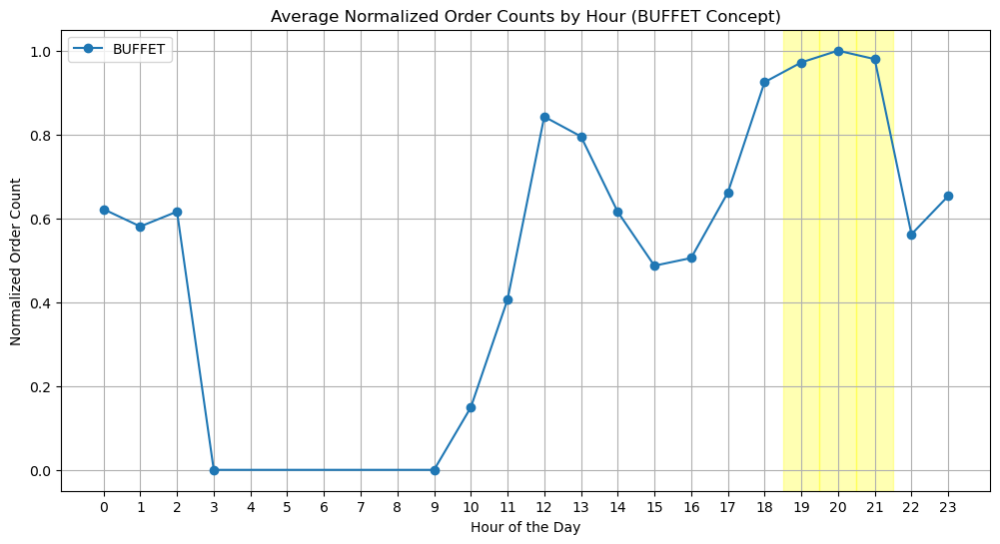

Peak hours for BUFFET concept:
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 20   ┆ 1.0                    │
│ 21   ┆ 0.979742               │
│ 19   ┆ 0.971906               │
└──────┴────────────────────────┘




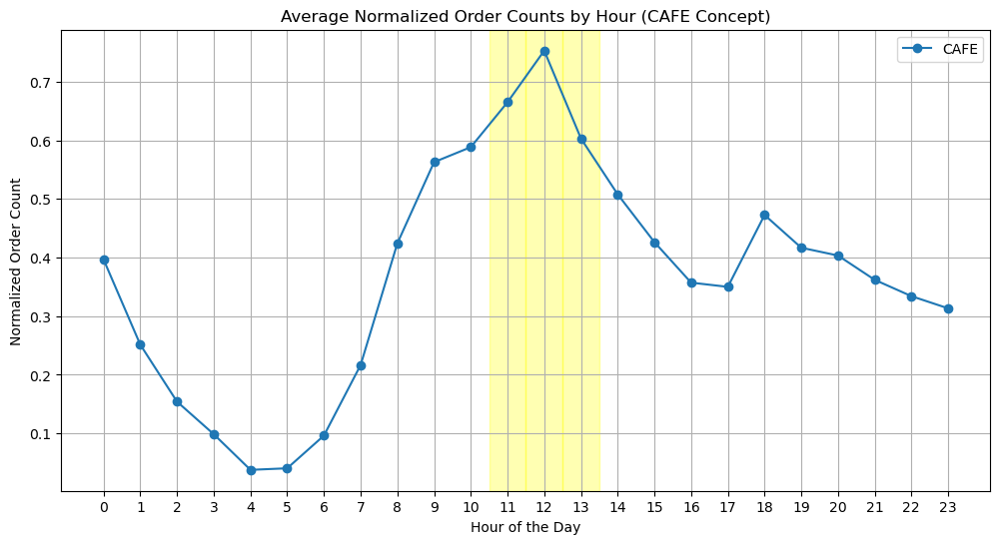

Peak hours for CAFE concept:
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 12   ┆ 0.753011               │
│ 11   ┆ 0.66501                │
│ 13   ┆ 0.603088               │
└──────┴────────────────────────┘




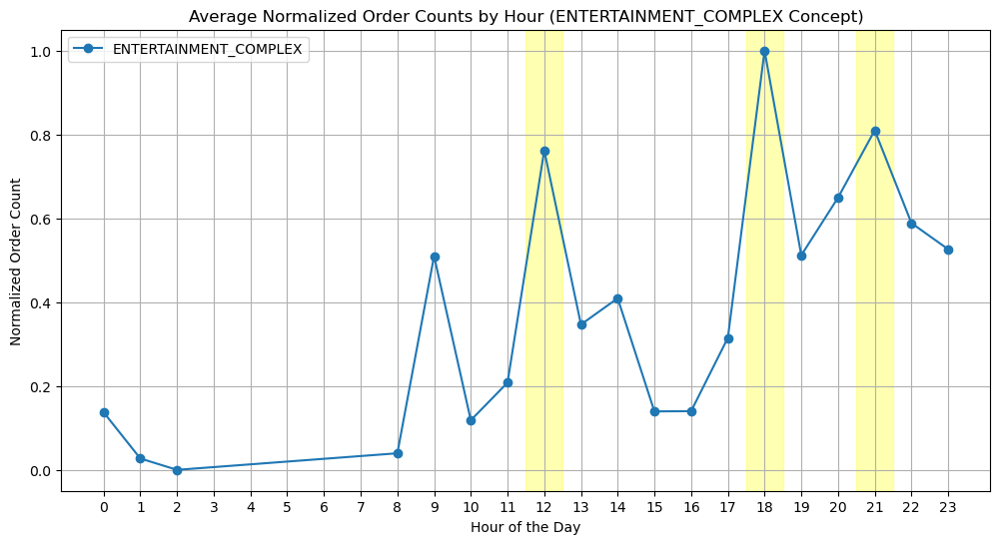

Peak hours for ENTERTAINMENT_COMPLEX concept:
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 18   ┆ 1.0                    │
│ 21   ┆ 0.809931               │
│ 12   ┆ 0.76202                │
└──────┴────────────────────────┘




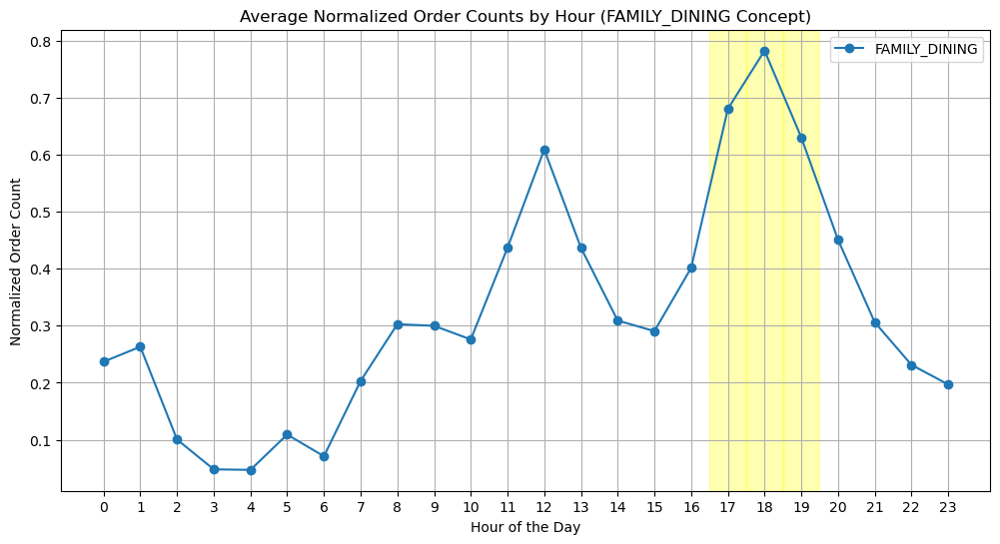

Peak hours for FAMILY_DINING concept:
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 18   ┆ 0.782556               │
│ 17   ┆ 0.680308               │
│ 19   ┆ 0.630204               │
└──────┴────────────────────────┘




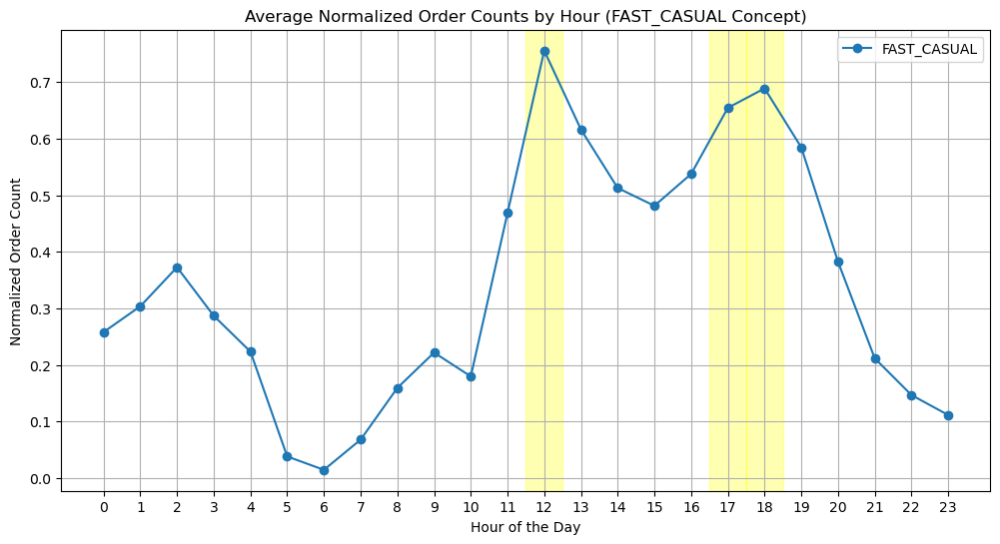

Peak hours for FAST_CASUAL concept:
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 12   ┆ 0.755621               │
│ 18   ┆ 0.688826               │
│ 17   ┆ 0.654426               │
└──────┴────────────────────────┘




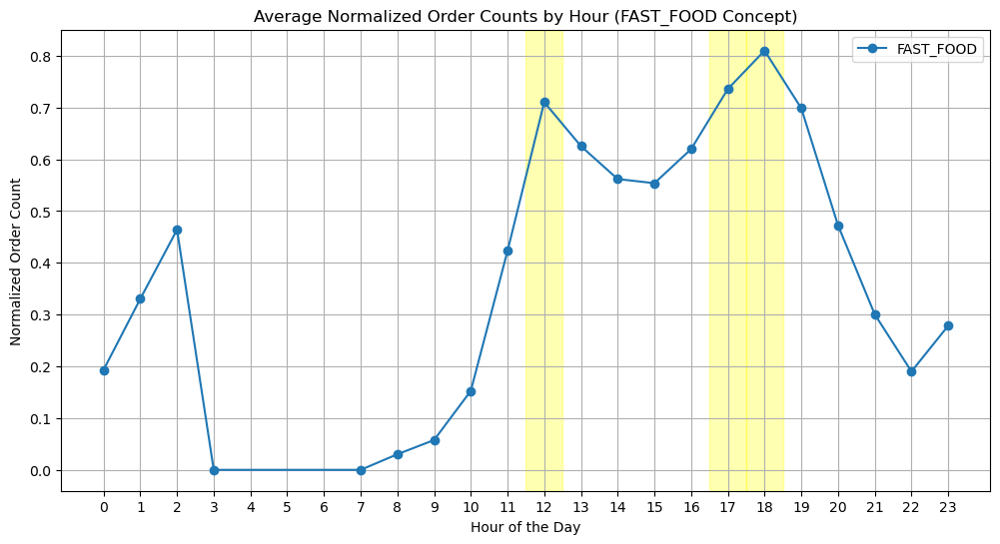

Peak hours for FAST_FOOD concept:
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 18   ┆ 0.809799               │
│ 17   ┆ 0.735739               │
│ 12   ┆ 0.710214               │
└──────┴────────────────────────┘




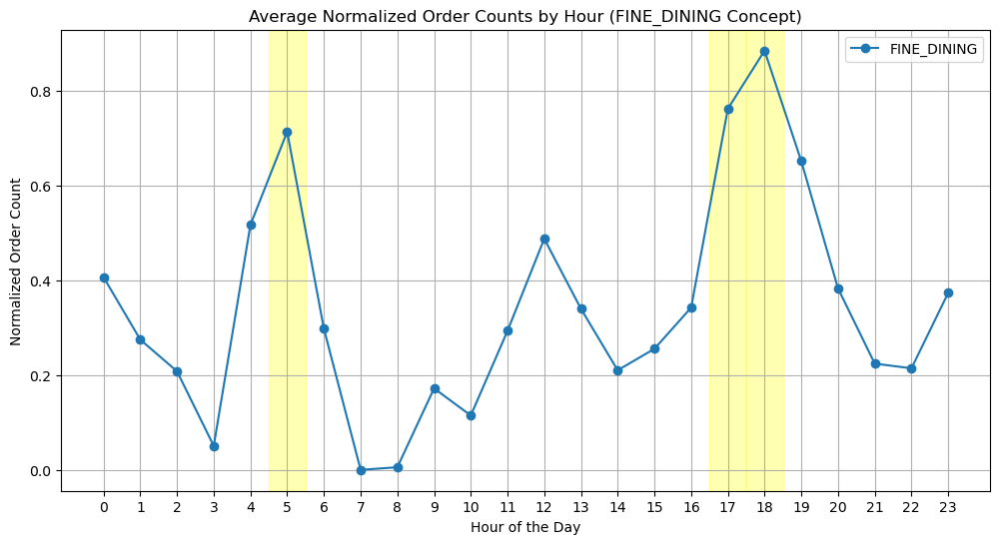

Peak hours for FINE_DINING concept:
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 18   ┆ 0.885673               │
│ 17   ┆ 0.762713               │
│ 5    ┆ 0.714286               │
└──────┴────────────────────────┘




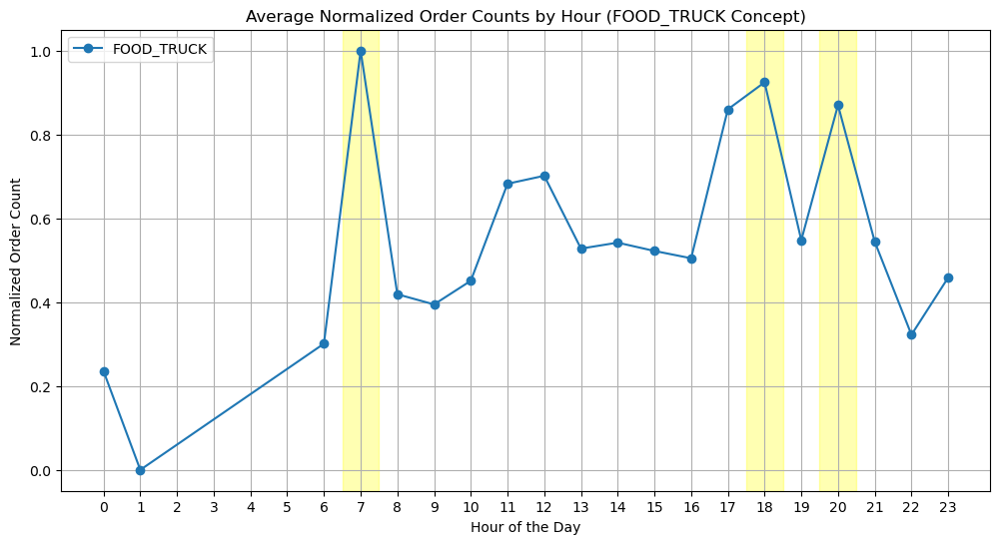

Peak hours for FOOD_TRUCK concept:
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 7    ┆ 1.0                    │
│ 18   ┆ 0.924481               │
│ 20   ┆ 0.870063               │
└──────┴────────────────────────┘




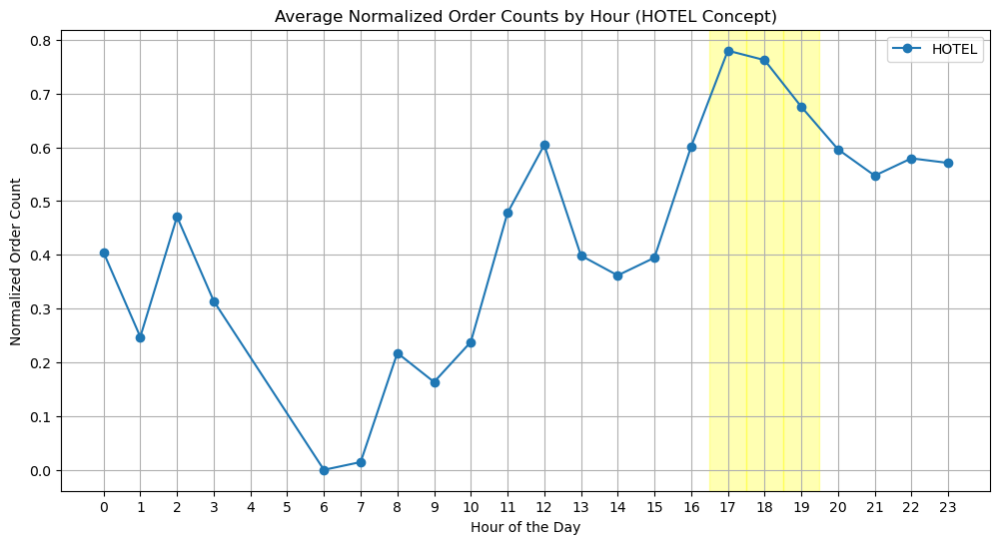

Peak hours for HOTEL concept:
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 17   ┆ 0.779963               │
│ 18   ┆ 0.762368               │
│ 19   ┆ 0.675583               │
└──────┴────────────────────────┘




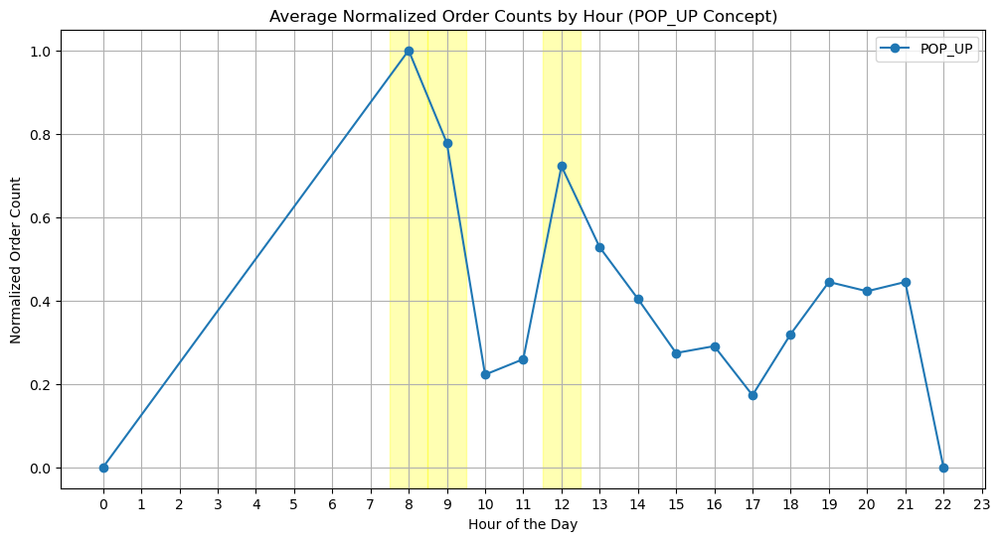

Peak hours for POP_UP concept:
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 8    ┆ 1.0                    │
│ 9    ┆ 0.777778               │
│ 12   ┆ 0.722222               │
└──────┴────────────────────────┘




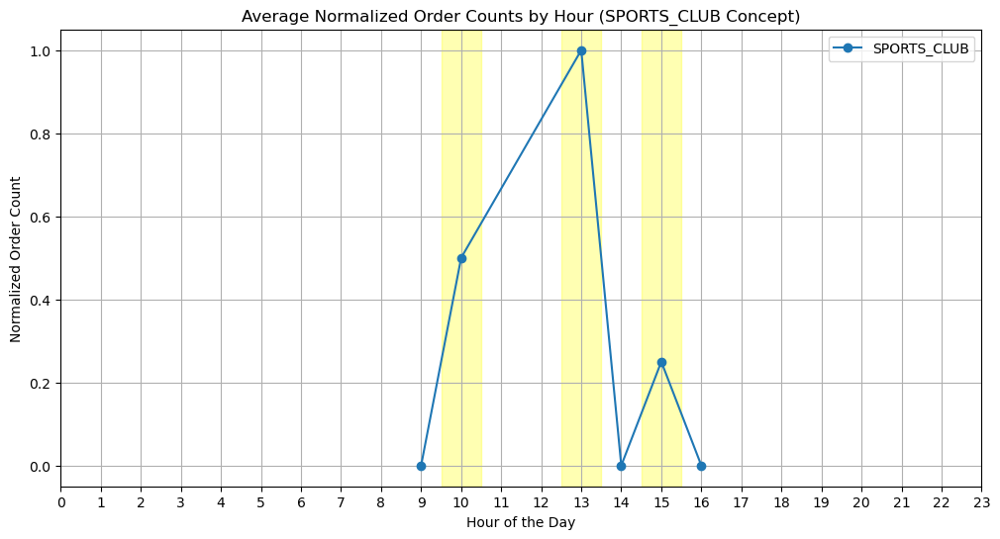

Peak hours for SPORTS_CLUB concept:
shape: (3, 2)
┌──────┬────────────────────────┐
│ hour ┆ normalized_order_count │
│ ---  ┆ ---                    │
│ i8   ┆ f64                    │
╞══════╪════════════════════════╡
│ 13   ┆ 1.0                    │
│ 10   ┆ 0.5                    │
│ 15   ┆ 0.25                   │
└──────┴────────────────────────┘




In [9]:
import matplotlib.pyplot as plt

# Aggregate by concept and hour
concept_hourly_avg = (
    average_hourly_order_counts
    .group_by(['concept', 'hour'])
    .agg(pl.mean('normalized_order_count').alias('normalized_order_count'))
    .sort(['concept', 'hour'])
)

# Iterate over each unique concept and generate plots
concepts = concept_hourly_avg.select('concept').unique().to_series().to_list()

for concept in concepts:
    plt.figure(figsize=(12, 6))
    concept_data = concept_hourly_avg.filter(pl.col('concept') == concept)
    
    # Plot the data
    plt.plot(concept_data['hour'], concept_data['normalized_order_count'], marker='o', label=concept)
    
    # Find peak hours (e.g., top 3 busiest hours)
    peak_hours = concept_data.sort('normalized_order_count', descending=True).head(3)
    
    # Highlight and shade the peak hours
    for row in peak_hours.iter_rows(named=True):
        plt.axvspan(row['hour'] - 0.5, row['hour'] + 0.5, color='yellow', alpha=0.3)
    
    plt.title(f'Average Normalized Order Counts by Hour ({concept} Concept)')
    plt.xlabel('Hour of the Day')
    plt.ylabel('Normalized Order Count')
    plt.grid(True)
    plt.xticks(range(0, 24))  # Ensure all hours are displayed
    plt.legend()
    plt.show()

    print(f"Peak hours for {concept} concept:")
    print(peak_hours[['hour', 'normalized_order_count']])
    print("\n" + "="*40 + "\n")


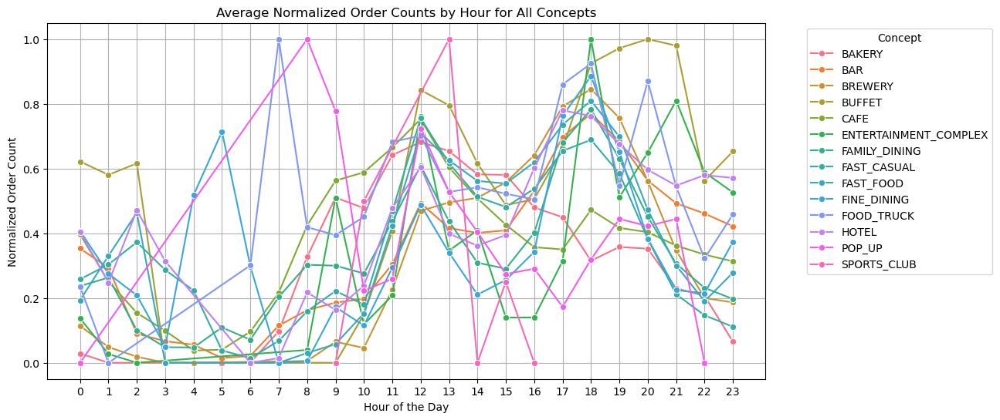

Peak hours for each concept:
shape: (14, 3)
┌─────────────┬──────────────┬────────────────────────────────┐
│ concept     ┆ peak_hours   ┆ peak_counts                    │
│ ---         ┆ ---          ┆ ---                            │
│ str         ┆ list[i8]     ┆ list[f64]                      │
╞═════════════╪══════════════╪════════════════════════════════╡
│ BAKERY      ┆ [12, 13, 11] ┆ [0.682075, 0.653923, 0.641594] │
│ BAR         ┆ [18, 17, 19] ┆ [0.769765, 0.697619, 0.684777] │
│ BREWERY     ┆ [18, 17, 19] ┆ [0.845708, 0.791958, 0.756124] │
│ BUFFET      ┆ [20, 21, 19] ┆ [1.0, 0.979742, 0.971906]      │
│ CAFE        ┆ [12, 11, 13] ┆ [0.753011, 0.66501, 0.603088]  │
│ …           ┆ …            ┆ …                              │
│ FINE_DINING ┆ [18, 17, 5]  ┆ [0.885673, 0.762713, 0.714286] │
│ FOOD_TRUCK  ┆ [7, 18, 20]  ┆ [1.0, 0.924481, 0.870063]      │
│ HOTEL       ┆ [17, 18, 19] ┆ [0.779963, 0.762368, 0.675583] │
│ POP_UP      ┆ [8, 9, 12]   ┆ [1.0, 0.777778, 0.722222]    

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

# Aggregate by concept and hour
concept_hourly_avg = (
    average_hourly_order_counts
    .group_by(['concept', 'hour'])
    .agg(pl.mean('normalized_order_count').alias('normalized_order_count'))
    .sort(['concept', 'hour'])
)

# Convert to pandas for seaborn compatibility
concept_hourly_avg_pd = concept_hourly_avg.to_pandas()

# Plot all concepts together
plt.figure(figsize=(12, 6))
sns.lineplot(data=concept_hourly_avg_pd, x='hour', y='normalized_order_count', hue='concept', marker='o')

plt.title('Average Normalized Order Counts by Hour for All Concepts')
plt.xlabel('Hour of the Day')
plt.ylabel('Normalized Order Count')
plt.grid(True)
plt.xticks(range(0, 24))  # Ensure all hours are displayed
plt.legend(title="Concept", bbox_to_anchor=(1.05, 1), loc='upper left')  # Move legend outside for better readability
plt.show()

# Find peak hours for each concept (top 3 busiest hours)
peak_hours_per_concept = (
    concept_hourly_avg
    .group_by('concept')
    .agg([
        pl.col('hour').sort_by(pl.col('normalized_order_count'), descending=True).head(3).alias('peak_hours'),
        pl.col('normalized_order_count').sort_by(pl.col('normalized_order_count'), descending=True).head(3).alias('peak_counts')
    ])
)

print("Peak hours for each concept:")
print(peak_hours_per_concept.select(['concept', 'peak_hours', 'peak_counts']))


## Segmentation

In [11]:
def analyze_peak_hours(data, kmeans=True, gmm=True, agglo=True, overlap=True, graph=False):
    """
    Analyze order data to identify peak hours using different clustering methods.
    
    Parameters:
    -----------
    data : polars.DataFrame
        DataFrame containing 'concept', 'hour', and 'normalized_order_count' columns
    kmeans : bool, default=True
        Whether to run KMeans clustering
    gmm : bool, default=True
        Whether to run Gaussian Mixture Model clustering
    agglo : bool, default=True
        Whether to run Agglomerative clustering
    overlap : bool, default=True
        Whether to analyze and visualize the overlap between different clustering results
        (Always plots agreement graphs regardless of 'graph' parameter)
    graph : bool, default=False
        Whether to display individual clustering method graphs
    
    Returns:
    --------
    dict
        Dictionary with concepts as keys and a list of peak hours for each clustering method,
        plus 'overlap_analysis' if overlap=True
    """
    from sklearn.cluster import KMeans, AgglomerativeClustering
    from sklearn.mixture import GaussianMixture
    import matplotlib.pyplot as plt
    import seaborn as sns
    import polars as pl
    import numpy as np
    
    # Group by concept and hour, then calculate the mean normalized order count
    concept_hourly_avg = (
        data
        .group_by(['concept', 'hour'])
        .agg(pl.mean('normalized_order_count').alias('normalized_order_count'))
    )

    concepts = concept_hourly_avg.select('concept').unique().to_series().to_list()
    
    # Store results
    results = {}
    
    for concept in concepts:
        results[concept] = {}
        concept_data = concept_hourly_avg.filter(pl.col('concept') == concept)
        
        # Reshape data for clustering
        X = concept_data.select('normalized_order_count').to_numpy()
        
        # Initialize dictionaries to track peak hours by method
        peak_hours_by_method = {}
        
        # 1. KMeans Clustering
        if kmeans:
            # Apply KMeans clustering (choosing 3 clusters for peak, mid, low)
            km = KMeans(n_clusters=3, random_state=42, n_init=10)
            km_labels = km.fit_predict(X)
            
            concept_data_km = concept_data.with_columns(
                pl.Series(name='cluster', values=km_labels)
            )
            
            # Determine which cluster represents peak hours (highest avg order count)
            cluster_means = (
                concept_data_km
                .group_by('cluster')
                .agg(pl.mean('normalized_order_count').alias('cluster_mean'))
                .sort('cluster_mean', descending=True)
            )
            peak_cluster = cluster_means[0, 'cluster']
            
            # Identify peak hours
            peak_hours = concept_data_km.filter(pl.col('cluster') == peak_cluster)
            
            # Store results
            results[concept]['kmeans'] = peak_hours.select(['hour', 'normalized_order_count']).sort('hour')
            peak_hours_by_method['kmeans'] = set(peak_hours.select('hour').to_series().to_list())
        
        # 2. Gaussian Mixture Model
        if gmm:
            # Apply Gaussian Mixture Model
            gm = GaussianMixture(n_components=3, random_state=42)
            gm_labels = gm.fit_predict(X)
            
            concept_data_gm = concept_data.with_columns(
                pl.Series(name='cluster', values=gm_labels)
            )
            
            # Determine peak cluster
            cluster_means = (
                concept_data_gm
                .group_by('cluster')
                .agg(pl.mean('normalized_order_count').alias('cluster_mean'))
                .sort('cluster_mean', descending=True)
            )
            peak_cluster = cluster_means[0, 'cluster']
            
            # Identify peak hours
            peak_hours = concept_data_gm.filter(pl.col('cluster') == peak_cluster)
            
            # Store results
            results[concept]['gmm'] = peak_hours.select(['hour', 'normalized_order_count']).sort('hour')
            peak_hours_by_method['gmm'] = set(peak_hours.select('hour').to_series().to_list())
        
        # 3. Agglomerative Clustering
        if agglo:
            # Apply Agglomerative Clustering
            ac = AgglomerativeClustering(n_clusters=3)
            ac_labels = ac.fit_predict(X)
            
            concept_data_ac = concept_data.with_columns(
                pl.Series(name='cluster', values=ac_labels)
            )
            
            # Determine peak cluster
            cluster_means = (
                concept_data_ac
                .group_by('cluster')
                .agg(pl.mean('normalized_order_count').alias('cluster_mean'))
                .sort('cluster_mean', descending=True)
            )
            peak_cluster = cluster_means[0, 'cluster']
            
            # Identify peak hours
            peak_hours = concept_data_ac.filter(pl.col('cluster') == peak_cluster)
            
            # Store results
            results[concept]['agglo'] = peak_hours.select(['hour', 'normalized_order_count']).sort('hour')
            peak_hours_by_method['agglo'] = set(peak_hours.select('hour').to_series().to_list())
        
        # Analyze overlap between methods if requested
        if overlap and len(peak_hours_by_method) > 0:
            # Create a DataFrame with all 24 hours
            all_hours = pl.DataFrame({'hour': range(24)})
            
            # Count how many methods consider each hour a peak hour
            overlap_counts = {}
            for hour in range(24):
                count = sum(1 for method, hours in peak_hours_by_method.items() if hour in hours)
                overlap_counts[hour] = count
            
            # Create a DataFrame with overlap information
            overlap_df = (
                all_hours
                .with_columns(
                    pl.Series(name='overlap_count', values=[overlap_counts[h] for h in range(24)])
                )
                .join(
                    concept_data.select(['hour', 'normalized_order_count']),
                    on='hour',
                    how='left'
                )
            )
            
            # Add categories for coloring based on overlap count
            overlap_df = overlap_df.with_columns(
                pl.when(pl.col('overlap_count') == 3).then(pl.lit('High (3)'))
                .when(pl.col('overlap_count') == 2).then(pl.lit('Medium (2)'))
                .when(pl.col('overlap_count') == 1).then(pl.lit('Low (1)'))
                .otherwise(pl.lit('None (0)'))
                .alias('overlap_category')
            )
            
            # Store overlap analysis in results
            results[concept]['overlap_analysis'] = overlap_df
            
            # Always display overlap graph when overlap=True, regardless of graph parameter
            plt.figure(figsize=(15, 8))
            
            # Create a color palette for the overlap categories
            colors = {'High (3)': 'red', 'Medium (2)': 'yellow', 'Low (1)': 'green', 'None (0)': 'lightgray'}
            
            # Plot normalized order counts
            sns.lineplot(
                data=concept_data.to_pandas(),
                x='hour',
                y='normalized_order_count',
                marker='o'
            )
            
            # Highlight hours based on overlap count
            for hour in range(24):
                if overlap_counts[hour] > 0:
                    color = colors[overlap_df.filter(pl.col('hour') == hour)[0, 'overlap_category']]
                    plt.axvspan(hour - 0.5, hour + 0.5, color=color, alpha=0.3)
            
            # Add a legend for the overlap categories
            from matplotlib.patches import Patch
            legend_elements = [
                Patch(facecolor='red', alpha=0.3, label='High agreement (3 methods)'),
                Patch(facecolor='yellow', alpha=0.3, label='Medium agreement (2 methods)'),
                Patch(facecolor='green', alpha=0.3, label='Low agreement (1 method)'),
            ]
            plt.legend(handles=legend_elements)
            
            plt.title(f'Peak Hour Overlap Analysis for {concept}')
            plt.xlabel('Hour of the Day')
            plt.ylabel('Normalized Order Count')
            plt.grid(True)
            plt.xticks(range(0, 24))
            plt.tight_layout()
            plt.show()
        
        # Plot individual clustering results only if graph=True
        if graph and (kmeans or gmm or agglo):
            # Determine number of subplots needed
            num_plots = sum([kmeans, gmm, agglo])
            
            plt.figure(figsize=(15, 5 * num_plots))
            plot_position = 0
            
            # KMeans plot
            if kmeans:
                plot_position += 1
                plt.subplot(num_plots, 1, plot_position)
                
                sns.lineplot(
                    data=concept_data_km.to_pandas(),
                    x='hour',
                    y='normalized_order_count'
                )
                
                # Highlight peak hours
                peak_hours = results[concept]['kmeans']
                for row in peak_hours.iter_rows(named=True):
                    plt.axvspan(row['hour'] - 0.5, row['hour'] + 0.5, color='yellow', alpha=0.3)
                
                plt.title(f'KMeans Clustering - {concept}')
                plt.xlabel('Hour of the Day')
                plt.ylabel('Normalized Count')
                plt.grid(True)
                plt.xticks(range(0, 24))
            
            # GMM plot
            if gmm:
                plot_position += 1
                plt.subplot(num_plots, 1, plot_position)
                
                sns.lineplot(
                    data=concept_data_gm.to_pandas(),
                    x='hour',
                    y='normalized_order_count'
                )
                
                # Highlight peak hours
                peak_hours = results[concept]['gmm']
                for row in peak_hours.iter_rows(named=True):
                    plt.axvspan(row['hour'] - 0.5, row['hour'] + 0.5, color='yellow', alpha=0.3)
                
                plt.title(f'GMM Clustering - {concept}')
                plt.xlabel('Hour of the Day')
                plt.ylabel('Normalized Count')
                plt.grid(True)
                plt.xticks(range(0, 24))
            
            # Agglomerative plot
            if agglo:
                plot_position += 1
                plt.subplot(num_plots, 1, plot_position)
                
                sns.lineplot(
                    data=concept_data_ac.to_pandas(),
                    x='hour',
                    y='normalized_order_count'
                )
                
                # Highlight peak hours
                peak_hours = results[concept]['agglo']
                for row in peak_hours.iter_rows(named=True):
                    plt.axvspan(row['hour'] - 0.5, row['hour'] + 0.5, color='yellow', alpha=0.3)
                
                plt.title(f'Agglomerative Clustering - {concept}')
                plt.xlabel('Hour of the Day')
                plt.ylabel('Normalized Count')
                plt.grid(True)
                plt.xticks(range(0, 24))
            
            plt.tight_layout()
            plt.show()
        
    return results

c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] The system cannot find the file specified
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
  File "c:\Users\Natha\miniconda3\envs\polars_env\lib\subprocess.py", line 503, in run
    with Popen(*popenargs, **kwargs) as process:
  File "c:\Users\Natha\miniconda3\envs\polars_env\lib\subprocess.py", line 971, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "c:\Users\Natha\miniconda3\envs\polars_env\lib\subprocess.py", line 1456, in _execute_child
    hp, ht, pid, tid = _

<Figure size 1200x600 with 0 Axes>

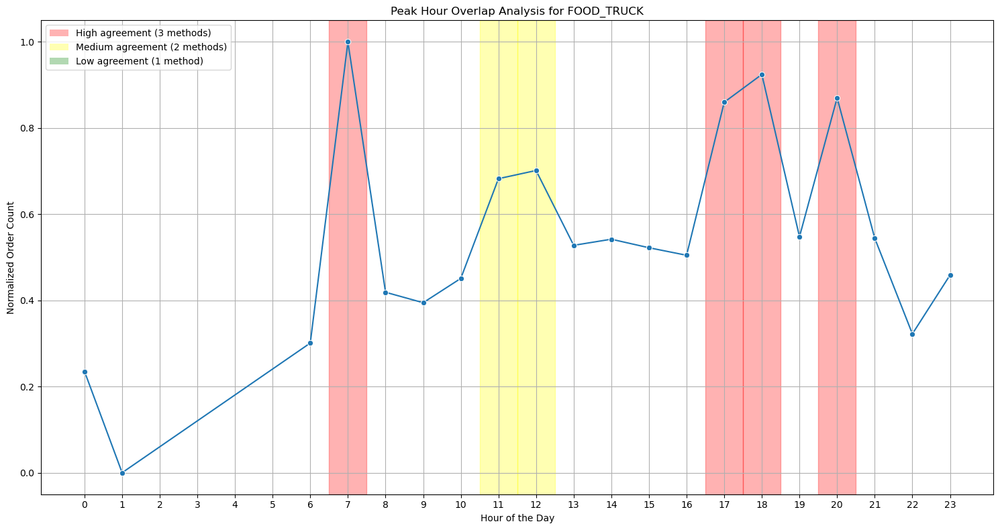

c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


<Figure size 1200x600 with 0 Axes>

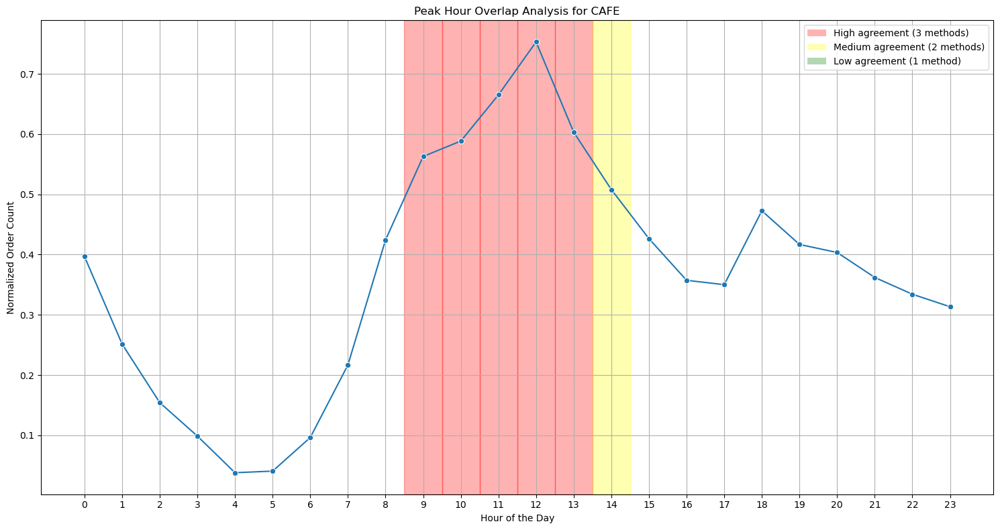

c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


<Figure size 1200x600 with 0 Axes>

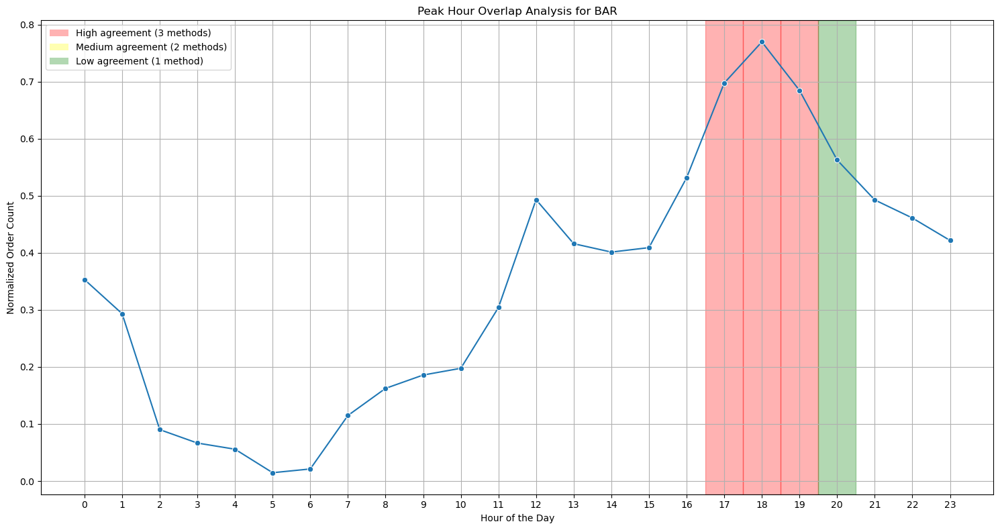

c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


<Figure size 1200x600 with 0 Axes>

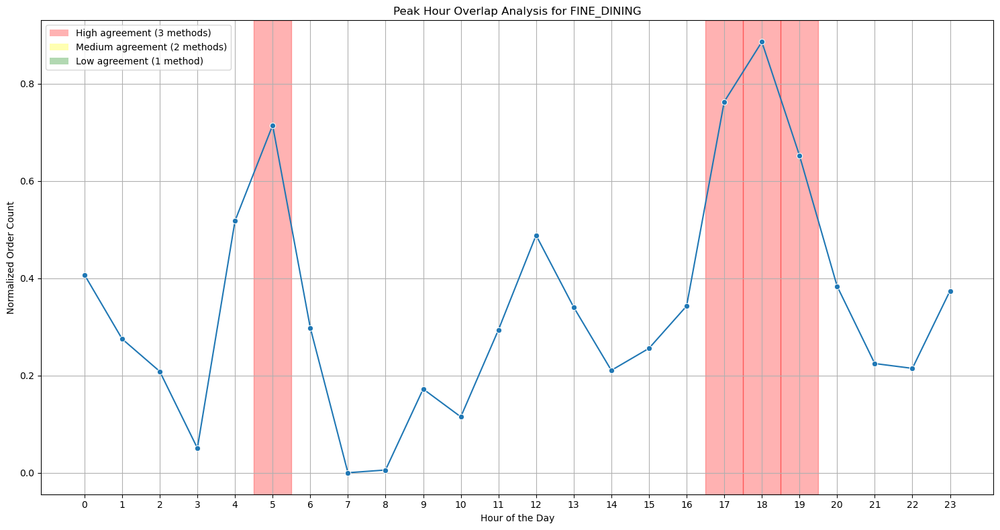

c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


<Figure size 1200x600 with 0 Axes>

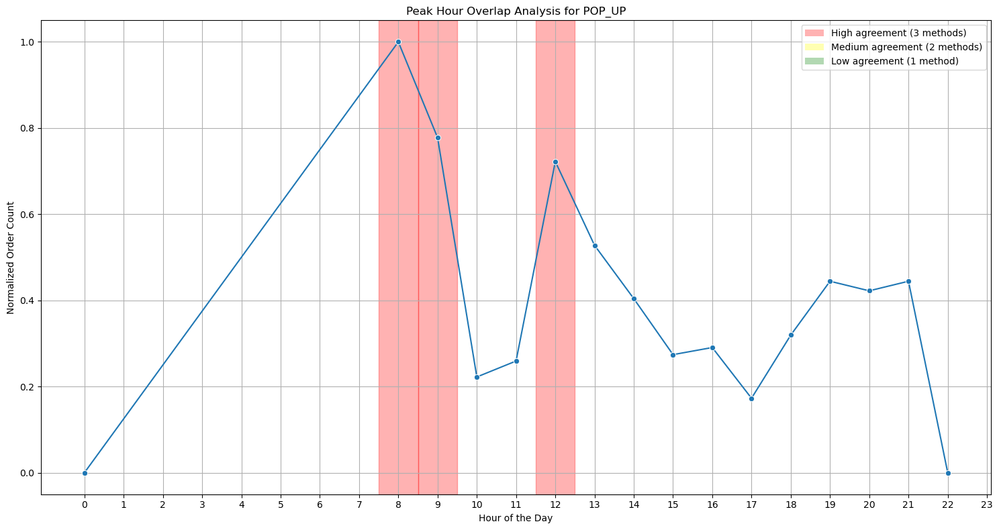

c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


<Figure size 1200x600 with 0 Axes>

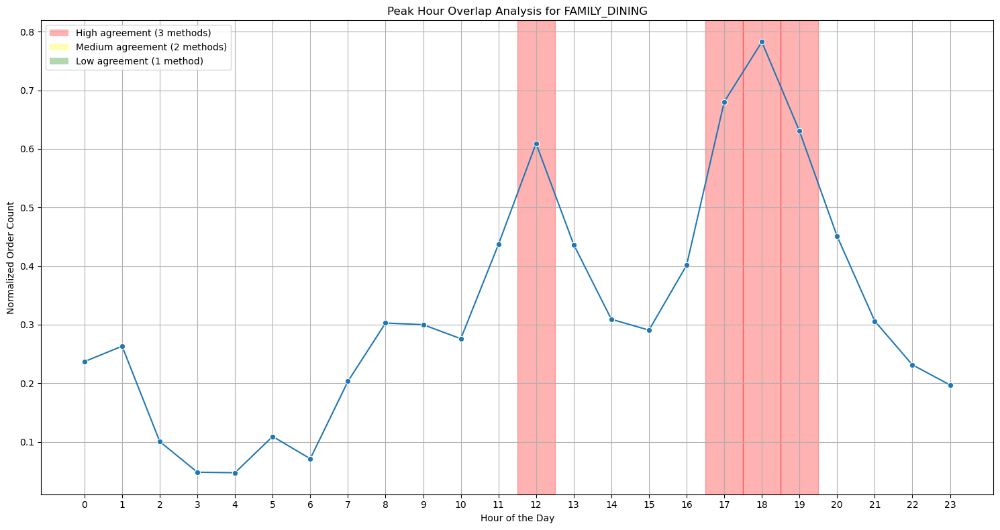

c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


<Figure size 1200x600 with 0 Axes>

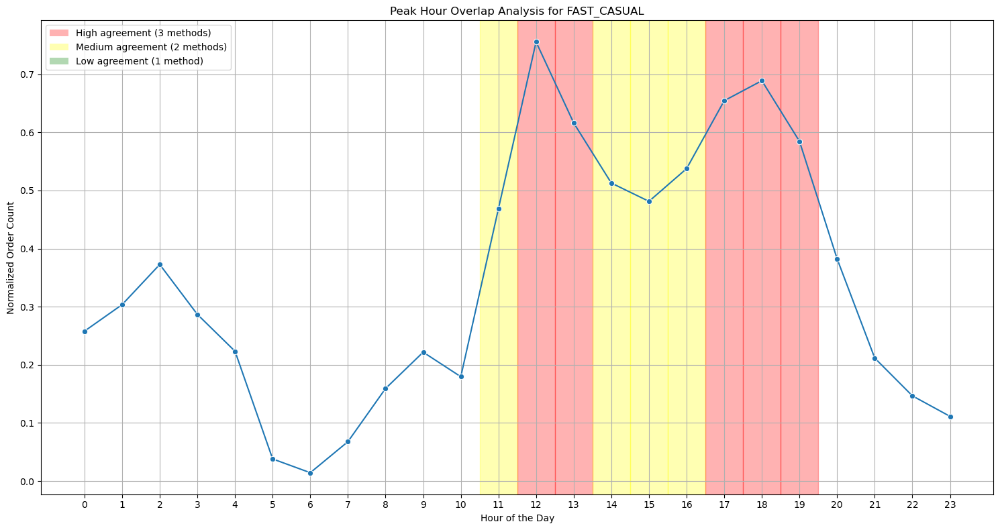

c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


<Figure size 1200x600 with 0 Axes>

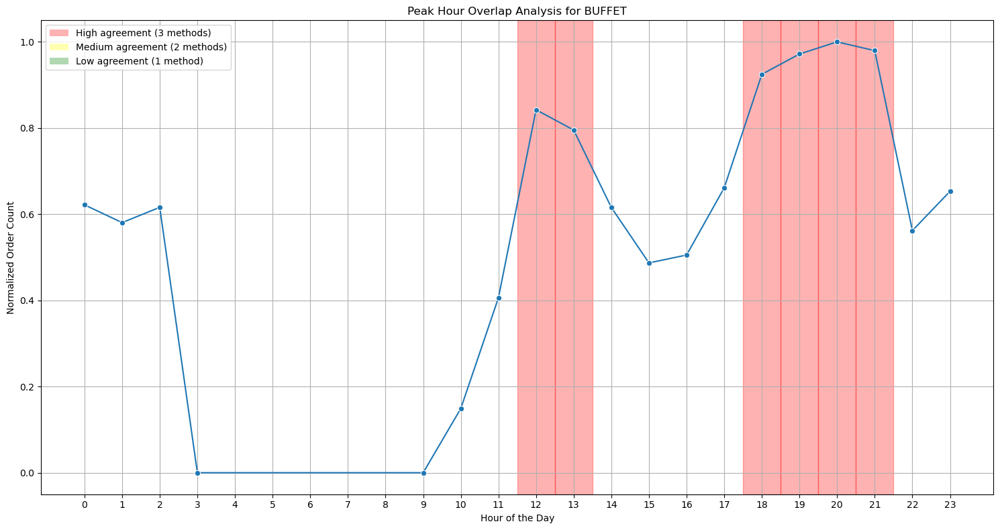

c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


<Figure size 1200x600 with 0 Axes>

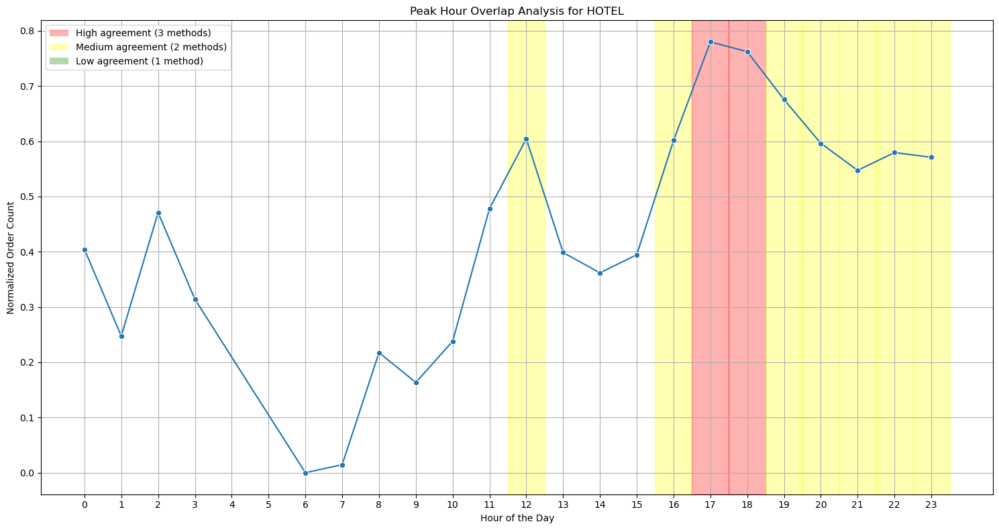

c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


<Figure size 1200x600 with 0 Axes>

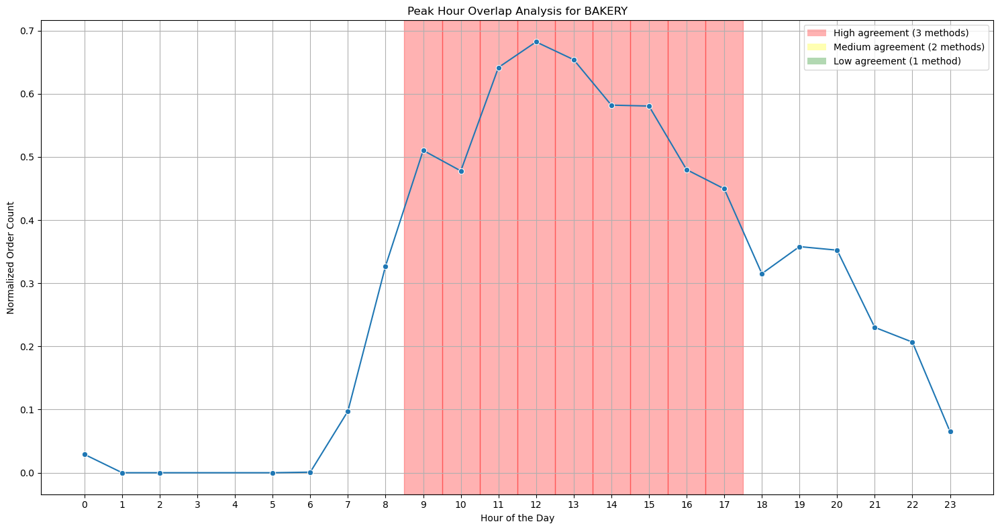

c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


<Figure size 1200x600 with 0 Axes>

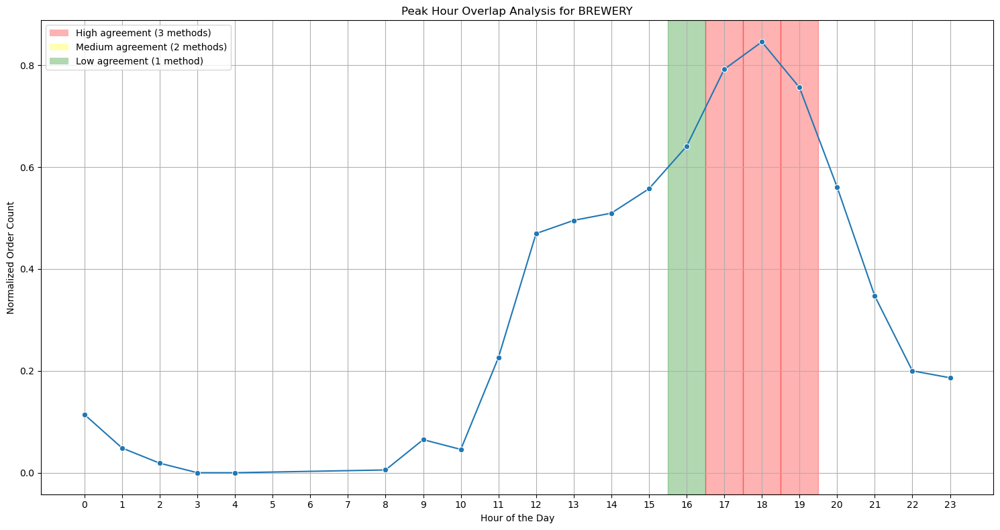

c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


<Figure size 1200x600 with 0 Axes>

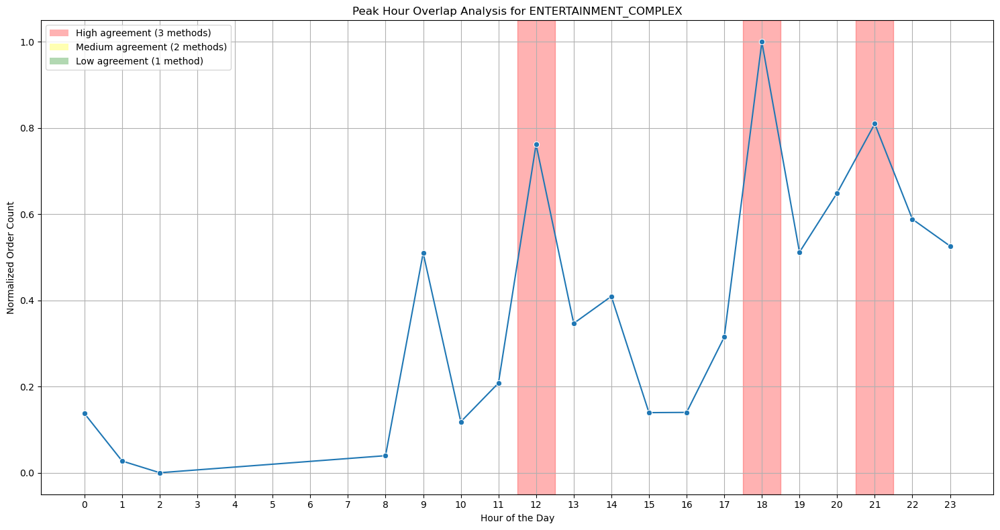

c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


<Figure size 1200x600 with 0 Axes>

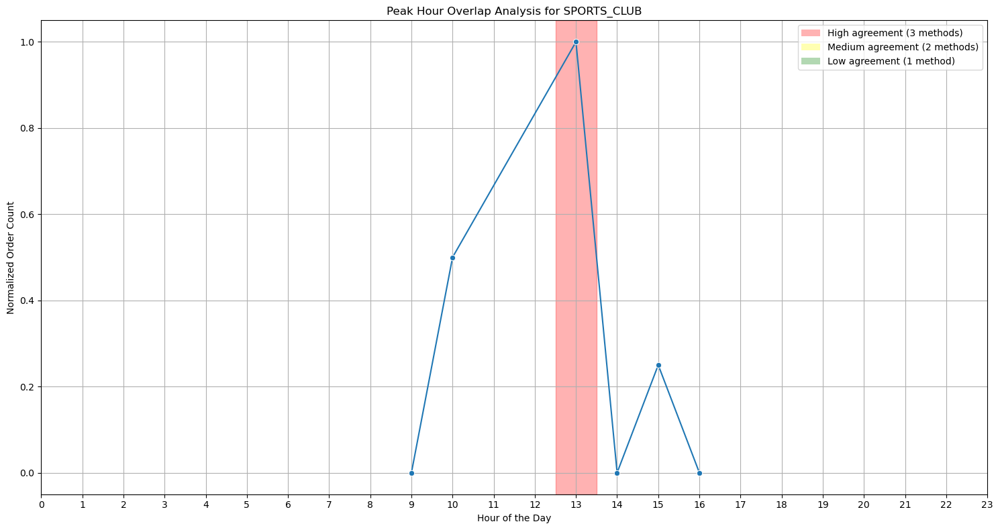

c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\Natha\miniconda3\envs\polars_env\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


<Figure size 1200x600 with 0 Axes>

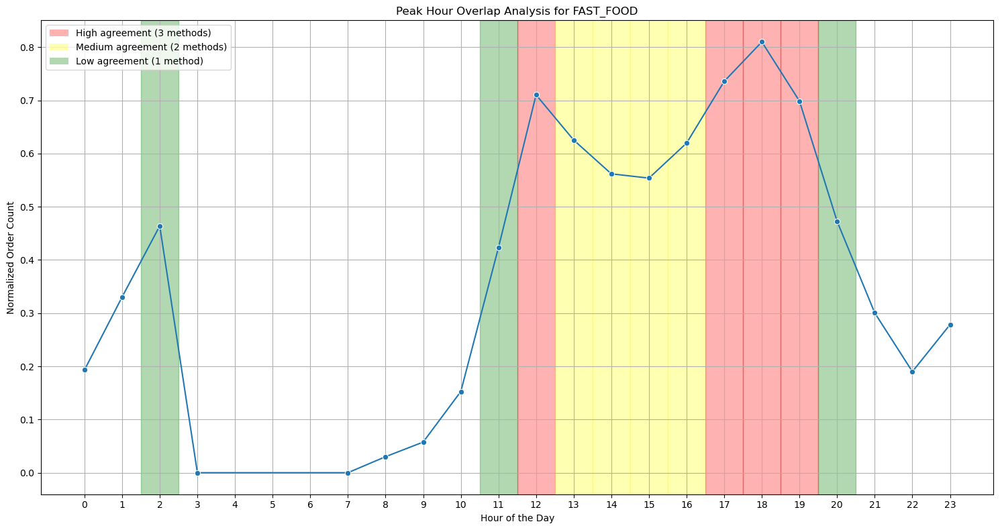

In [12]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Group by concept and hour, then calculate the mean normalized order count
concept_hourly_avg = (
    average_hourly_order_counts
    .group_by(['concept', 'hour'])
    .agg(pl.mean('normalized_order_count').alias('normalized_order_count'))
)

concepts = concept_hourly_avg.select('concept').unique().to_series().to_list()

for concept in concepts:
    plt.figure(figsize=(12, 6))
    concept_data = concept_hourly_avg.filter(pl.col('concept') == concept)
    
    analyze_peak_hours(concept_data, kmeans=True, gmm=True, agglo=True, overlap=True, graph=False)